In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 3
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['specific_huimidity'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + 12*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 3
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       10

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

3
179
(84, 2151)
(11, 2151)


[I 2025-05-18 23:16:54,814] A new study created in memory with name: no-name-5b918ede-eb3a-469c-ae04-e95ed66d7add
[I 2025-05-18 23:25:32,570] Trial 0 finished with value: 2.759365129470825 and parameters: {'lr': 0.31590510632820346, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.45789529717137845}. Best is trial 0 with value: 2.759365129470825.


Cross Validation Accuracies:
[1.92420494556427, 1.754297137260437, 5.506165981292725, 2.4456233978271484, 2.166534185409546]
Mean Cross Validation Accuracy:
2.759365129470825
Standard Deviation of Cross Validation Accuracy:
1.393014825745191


[I 2025-05-18 23:35:05,409] Trial 1 finished with value: 0.04686656594276428 and parameters: {'lr': 0.007815127864592451, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.38322686122997174}. Best is trial 1 with value: 0.04686656594276428.


Cross Validation Accuracies:
[0.0433792844414711, 0.04298266023397446, 0.06104622781276703, 0.04356147348880768, 0.04336318373680115]
Mean Cross Validation Accuracy:
0.04686656594276428
Standard Deviation of Cross Validation Accuracy:
0.007092333742597025


[I 2025-05-18 23:41:44,028] Trial 2 finished with value: 0.04334990382194519 and parameters: {'lr': 0.0011631783961963422, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.25095102960793214}. Best is trial 2 with value: 0.04334990382194519.


Cross Validation Accuracies:
[0.03824783116579056, 0.03342195227742195, 0.05564329773187637, 0.04469483345746994, 0.04474160447716713]
Mean Cross Validation Accuracy:
0.04334990382194519
Standard Deviation of Cross Validation Accuracy:
0.007476209835499178


[I 2025-05-18 23:51:54,888] Trial 3 finished with value: 0.06677656695246696 and parameters: {'lr': 0.0029604889611238062, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.4220785791804591}. Best is trial 2 with value: 0.04334990382194519.


Cross Validation Accuracies:
[0.07274860888719559, 0.07068155705928802, 0.05814552307128906, 0.05365068092942238, 0.07865646481513977]
Mean Cross Validation Accuracy:
0.06677656695246696
Standard Deviation of Cross Validation Accuracy:
0.009368351063029622


[I 2025-05-19 00:00:23,571] Trial 4 finished with value: 0.07732482403516769 and parameters: {'lr': 0.011921900347432231, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.23585413540779074}. Best is trial 2 with value: 0.04334990382194519.


Cross Validation Accuracies:
[0.07012667506933212, 0.07061589509248734, 0.08468234539031982, 0.06377162784337997, 0.09742757678031921]
Mean Cross Validation Accuracy:
0.07732482403516769
Standard Deviation of Cross Validation Accuracy:
0.012155377341157285


[I 2025-05-19 00:11:16,376] Trial 5 finished with value: 3.1049578905105593 and parameters: {'lr': 0.2876302761655058, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2376229069154548}. Best is trial 2 with value: 0.04334990382194519.


Cross Validation Accuracies:
[3.0464677810668945, 5.430216312408447, 3.4390814304351807, 1.5829297304153442, 2.0260941982269287]
Mean Cross Validation Accuracy:
3.1049578905105593
Standard Deviation of Cross Validation Accuracy:
1.3418198797224792


[I 2025-05-19 00:19:36,950] Trial 6 finished with value: 0.7853106796741486 and parameters: {'lr': 0.06821394423511312, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.16018208398508144}. Best is trial 2 with value: 0.04334990382194519.


Cross Validation Accuracies:
[0.47220614552497864, 0.7876266837120056, 0.927079439163208, 0.671893298625946, 1.0677478313446045]
Mean Cross Validation Accuracy:
0.7853106796741486
Standard Deviation of Cross Validation Accuracy:
0.20531558212376


[I 2025-05-19 00:28:51,854] Trial 7 finished with value: 0.04332407638430595 and parameters: {'lr': 0.007329328038159512, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.22854758019559465}. Best is trial 7 with value: 0.04332407638430595.


Cross Validation Accuracies:
[0.03932453691959381, 0.03403235599398613, 0.05450098216533661, 0.04470739886164665, 0.04405510798096657]
Mean Cross Validation Accuracy:
0.04332407638430595
Standard Deviation of Cross Validation Accuracy:
0.006777958318717277


[I 2025-05-19 00:39:47,666] Trial 8 finished with value: 2.1593953371047974 and parameters: {'lr': 0.4737544810328564, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.387255400174527}. Best is trial 7 with value: 0.04332407638430595.


Cross Validation Accuracies:
[0.38576269149780273, 2.4128363132476807, 3.0522780418395996, 1.7074962854385376, 3.238603353500366]
Mean Cross Validation Accuracy:
2.1593953371047974
Standard Deviation of Cross Validation Accuracy:
1.0369327181562924


[I 2025-05-19 00:45:27,043] Trial 9 finished with value: 0.044040121138095856 and parameters: {'lr': 0.006547887866733265, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4766887818881169}. Best is trial 7 with value: 0.04332407638430595.


Cross Validation Accuracies:
[0.036261118948459625, 0.03324002027511597, 0.05517816171050072, 0.05056443437933922, 0.04495687037706375]
Mean Cross Validation Accuracy:
0.044040121138095856
Standard Deviation of Cross Validation Accuracy:
0.008302024981249486


[I 2025-05-19 00:54:42,050] Trial 10 finished with value: 0.04626157805323601 and parameters: {'lr': 0.05773164694905827, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.12655714829310416}. Best is trial 7 with value: 0.04332407638430595.


Cross Validation Accuracies:
[0.049376070499420166, 0.03850848972797394, 0.05232644081115723, 0.04010290652513504, 0.05099398270249367]
Mean Cross Validation Accuracy:
0.04626157805323601
Standard Deviation of Cross Validation Accuracy:
0.005777852383099277


[I 2025-05-19 01:01:37,098] Trial 11 finished with value: 0.04376225546002388 and parameters: {'lr': 0.0011261179921854087, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.30230909510740606}. Best is trial 7 with value: 0.04332407638430595.


Cross Validation Accuracies:
[0.03961540758609772, 0.03193749114871025, 0.05694897472858429, 0.04531954973936081, 0.04498985409736633]
Mean Cross Validation Accuracy:
0.04376225546002388
Standard Deviation of Cross Validation Accuracy:
0.008183436041935995


[I 2025-05-19 01:08:13,556] Trial 12 finished with value: 0.2684535622596741 and parameters: {'lr': 0.0010376685166853085, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.2834703395753619}. Best is trial 7 with value: 0.04332407638430595.


Cross Validation Accuracies:
[0.3077060282230377, 0.3755732476711273, 0.2272733598947525, 0.2394506335258484, 0.19226454198360443]
Mean Cross Validation Accuracy:
0.2684535622596741
Standard Deviation of Cross Validation Accuracy:
0.06535614560152143


[I 2025-05-19 01:14:28,139] Trial 13 finished with value: 0.04315321296453476 and parameters: {'lr': 0.002675120589074145, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.19827273625199748}. Best is trial 13 with value: 0.04315321296453476.


Cross Validation Accuracies:
[0.039107490330934525, 0.03265738859772682, 0.055795010179281235, 0.04377446323633194, 0.04443171247839928]
Mean Cross Validation Accuracy:
0.04315321296453476
Standard Deviation of Cross Validation Accuracy:
0.007594284041209363


[I 2025-05-19 01:20:58,566] Trial 14 finished with value: 0.13746023774147034 and parameters: {'lr': 0.0228648330925684, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.173412972783041}. Best is trial 13 with value: 0.04315321296453476.


Cross Validation Accuracies:
[0.1357385218143463, 0.14026562869548798, 0.1431201696395874, 0.12861433625221252, 0.13956253230571747]
Mean Cross Validation Accuracy:
0.13746023774147034
Standard Deviation of Cross Validation Accuracy:
0.005010767781935942


[I 2025-05-19 01:29:01,747] Trial 15 finished with value: 0.04334908276796341 and parameters: {'lr': 0.004185458260663753, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.19140439723695546}. Best is trial 13 with value: 0.04315321296453476.


Cross Validation Accuracies:
[0.03903607651591301, 0.03324729949235916, 0.05587946996092796, 0.044023364782333374, 0.04455920308828354]
Mean Cross Validation Accuracy:
0.04334908276796341
Standard Deviation of Cross Validation Accuracy:
0.0074776694084142045


[I 2025-05-19 01:36:38,842] Trial 16 finished with value: 0.06405234634876251 and parameters: {'lr': 0.002860351323047376, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.32447742300966403}. Best is trial 13 with value: 0.04315321296453476.


Cross Validation Accuracies:
[0.05991199240088463, 0.046659599989652634, 0.09740340709686279, 0.07288796454668045, 0.043398767709732056]
Mean Cross Validation Accuracy:
0.06405234634876251
Standard Deviation of Cross Validation Accuracy:
0.019680355023665132


[I 2025-05-19 01:42:49,454] Trial 17 finished with value: 0.042647707462310794 and parameters: {'lr': 0.020913721796270372, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.10316151705859475}. Best is trial 17 with value: 0.042647707462310794.


Cross Validation Accuracies:
[0.03832429274916649, 0.032587189227342606, 0.05411331355571747, 0.04474060237407684, 0.04347313940525055]
Mean Cross Validation Accuracy:
0.042647707462310794
Standard Deviation of Cross Validation Accuracy:
0.0071613910943509555


[I 2025-05-19 01:50:45,656] Trial 18 finished with value: 0.06383172273635865 and parameters: {'lr': 0.12261578563549085, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.12234117246897971}. Best is trial 17 with value: 0.042647707462310794.


Cross Validation Accuracies:
[0.06263413280248642, 0.05765572562813759, 0.07595405727624893, 0.05946952477097511, 0.06344517320394516]
Mean Cross Validation Accuracy:
0.06383172273635865
Standard Deviation of Cross Validation Accuracy:
0.006414146057858198


[I 2025-05-19 01:58:00,017] Trial 19 finished with value: 0.624719911813736 and parameters: {'lr': 0.025857274808058564, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.10798209197924913}. Best is trial 17 with value: 0.042647707462310794.


Cross Validation Accuracies:
[0.6154670119285583, 0.5986574292182922, 0.563101053237915, 0.47638270258903503, 0.8699913620948792]
Mean Cross Validation Accuracy:
0.624719911813736
Standard Deviation of Cross Validation Accuracy:
0.1316994797644227


[I 2025-05-19 02:05:08,030] Trial 20 finished with value: 0.04220656454563141 and parameters: {'lr': 0.01562533202361369, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.18790247606769694}. Best is trial 20 with value: 0.04220656454563141.


Cross Validation Accuracies:
[0.03231938183307648, 0.039666399359703064, 0.053402792662382126, 0.04396487772464752, 0.041679371148347855]
Mean Cross Validation Accuracy:
0.04220656454563141
Standard Deviation of Cross Validation Accuracy:
0.006825451535528004


[I 2025-05-19 02:12:03,232] Trial 21 finished with value: 0.0433526448905468 and parameters: {'lr': 0.01682425986431471, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.19932764373186945}. Best is trial 20 with value: 0.04220656454563141.


Cross Validation Accuracies:
[0.04257446154952049, 0.03162612393498421, 0.05410771071910858, 0.0440361388027668, 0.04441878944635391]
Mean Cross Validation Accuracy:
0.0433526448905468
Standard Deviation of Cross Validation Accuracy:
0.007146917267635267


[I 2025-05-19 02:18:43,092] Trial 22 finished with value: 0.05262258872389793 and parameters: {'lr': 0.051453949807808125, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.15058895318875454}. Best is trial 20 with value: 0.04220656454563141.


Cross Validation Accuracies:
[0.04574146494269371, 0.05308176577091217, 0.05262218415737152, 0.049673594534397125, 0.06199393421411514]
Mean Cross Validation Accuracy:
0.05262258872389793
Standard Deviation of Cross Validation Accuracy:
0.0053680423106223195


[I 2025-05-19 02:25:24,510] Trial 23 finished with value: 0.04327182248234749 and parameters: {'lr': 0.002501119704264011, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.14408075913806817}. Best is trial 20 with value: 0.04220656454563141.


Cross Validation Accuracies:
[0.038908254355192184, 0.033346183598041534, 0.05502401292324066, 0.04413153603672981, 0.04494912549853325]
Mean Cross Validation Accuracy:
0.04327182248234749
Standard Deviation of Cross Validation Accuracy:
0.007200353699988458


[I 2025-05-19 02:32:10,904] Trial 24 finished with value: 0.06330109611153603 and parameters: {'lr': 0.11932616577432784, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.10050898332394537}. Best is trial 20 with value: 0.04220656454563141.


Cross Validation Accuracies:
[0.06234491243958473, 0.05563785880804062, 0.06911880522966385, 0.06553567945957184, 0.06386822462081909]
Mean Cross Validation Accuracy:
0.06330109611153603
Standard Deviation of Cross Validation Accuracy:
0.0044452273294556715


[I 2025-05-19 02:39:24,486] Trial 25 finished with value: 0.042699995636940005 and parameters: {'lr': 0.011588593770767064, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.20065412933776516}. Best is trial 20 with value: 0.04220656454563141.


Cross Validation Accuracies:
[0.03754472732543945, 0.031902242451906204, 0.05483632907271385, 0.045624926686286926, 0.04359175264835358]
Mean Cross Validation Accuracy:
0.042699995636940005
Standard Deviation of Cross Validation Accuracy:
0.007743504460947776


[I 2025-05-19 02:47:01,288] Trial 26 finished with value: 0.04399119764566421 and parameters: {'lr': 0.011893265647457506, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2810974523375267}. Best is trial 20 with value: 0.04220656454563141.


Cross Validation Accuracies:
[0.04119555279612541, 0.03206195682287216, 0.054958272725343704, 0.04781341180205345, 0.043926794081926346]
Mean Cross Validation Accuracy:
0.04399119764566421
Standard Deviation of Cross Validation Accuracy:
0.007550001608113372


[I 2025-05-19 02:54:04,270] Trial 27 finished with value: 0.0409891813993454 and parameters: {'lr': 0.036647009318637035, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.17968755224109445}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.03342946991324425, 0.02991681545972824, 0.0559573620557785, 0.042773474007844925, 0.04286878556013107]
Mean Cross Validation Accuracy:
0.0409891813993454
Standard Deviation of Cross Validation Accuracy:
0.009061010642654504


[I 2025-05-19 03:00:39,604] Trial 28 finished with value: 0.04703001156449318 and parameters: {'lr': 0.10723574825827856, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.17337031477624495}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.04500258341431618, 0.038710225373506546, 0.05674323812127113, 0.04857205972075462, 0.046121951192617416]
Mean Cross Validation Accuracy:
0.04703001156449318
Standard Deviation of Cross Validation Accuracy:
0.005845999717180269


[I 2025-05-19 03:08:47,776] Trial 29 finished with value: 0.04895118810236454 and parameters: {'lr': 0.037263080114430025, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.13517210373894345}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.04576664790511131, 0.030852409079670906, 0.0578460730612278, 0.05450032651424408, 0.055790483951568604]
Mean Cross Validation Accuracy:
0.04895118810236454
Standard Deviation of Cross Validation Accuracy:
0.009943791848573314


[I 2025-05-19 03:16:23,258] Trial 30 finished with value: 0.049176208674907684 and parameters: {'lr': 0.18608996762735497, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.33564972796421183}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.053103256970644, 0.03769562393426895, 0.055895522236824036, 0.04826970398426056, 0.05091693624854088]
Mean Cross Validation Accuracy:
0.049176208674907684
Standard Deviation of Cross Validation Accuracy:
0.00626460840415676


[I 2025-05-19 03:23:42,317] Trial 31 finished with value: 0.04220225438475609 and parameters: {'lr': 0.016318370315026247, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1941502227681023}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.035697244107723236, 0.03324412181973457, 0.05462494120001793, 0.04464635252952576, 0.042798612266778946]
Mean Cross Validation Accuracy:
0.04220225438475609
Standard Deviation of Cross Validation Accuracy:
0.007526163749634999


[I 2025-05-19 03:32:36,838] Trial 32 finished with value: 0.041654723882675174 and parameters: {'lr': 0.021270457535775996, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.21615293310526304}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.035730328410863876, 0.03235936909914017, 0.05423014983534813, 0.04247922822833061, 0.04347454383969307]
Mean Cross Validation Accuracy:
0.041654723882675174
Standard Deviation of Cross Validation Accuracy:
0.0075317324997815896


[I 2025-05-19 03:40:50,350] Trial 33 finished with value: 0.16845781803131105 and parameters: {'lr': 0.9846270518516121, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.26178285310685456}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.16755299270153046, 0.16977834701538086, 0.16880486905574799, 0.1656082719564438, 0.1705446094274521]
Mean Cross Validation Accuracy:
0.16845781803131105
Standard Deviation of Cross Validation Accuracy:
0.001741123846976051


[I 2025-05-19 03:47:43,129] Trial 34 finished with value: 0.045413057506084445 and parameters: {'lr': 0.038836038965621496, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.2192973775693438}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.04055098816752434, 0.03859972953796387, 0.05550885200500488, 0.045351725071668625, 0.0470539927482605]
Mean Cross Validation Accuracy:
0.045413057506084445
Standard Deviation of Cross Validation Accuracy:
0.005910713204937274


[I 2025-05-19 03:54:50,263] Trial 35 finished with value: 0.04286695495247841 and parameters: {'lr': 0.016484301451687063, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.2618101952779584}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.036787644028663635, 0.03321700915694237, 0.054954078048467636, 0.04668884351849556, 0.042687200009822845]
Mean Cross Validation Accuracy:
0.04286695495247841
Standard Deviation of Cross Validation Accuracy:
0.0076264954461830676


[I 2025-05-19 04:02:33,276] Trial 36 finished with value: 0.04468288719654083 and parameters: {'lr': 0.03367806946797135, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.17416643906471546}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.03959937021136284, 0.03548429161310196, 0.05608926713466644, 0.04695950821042061, 0.04528199881315231]
Mean Cross Validation Accuracy:
0.04468288719654083
Standard Deviation of Cross Validation Accuracy:
0.007015750094025963


[I 2025-05-19 04:10:05,139] Trial 37 finished with value: 0.04711185321211815 and parameters: {'lr': 0.005872854207652226, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.2202166080613076}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.038343220949172974, 0.037532273679971695, 0.05459780991077423, 0.05999229848384857, 0.04509366303682327]
Mean Cross Validation Accuracy:
0.04711185321211815
Standard Deviation of Cross Validation Accuracy:
0.008884545744733779


[I 2025-05-19 04:17:22,316] Trial 38 finished with value: 0.04319404140114784 and parameters: {'lr': 0.008930749390460334, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.2507190673440138}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.037627924233675, 0.03228627145290375, 0.05503075197339058, 0.04626871645450592, 0.04475654289126396]
Mean Cross Validation Accuracy:
0.04319404140114784
Standard Deviation of Cross Validation Accuracy:
0.007771278663479434


[I 2025-05-19 04:23:33,615] Trial 39 finished with value: 0.05466137081384659 and parameters: {'lr': 0.0836898659607508, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.21442141352864402}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.03486044332385063, 0.040330126881599426, 0.06311511248350143, 0.07918877899646759, 0.05581239238381386]
Mean Cross Validation Accuracy:
0.05466137081384659
Standard Deviation of Cross Validation Accuracy:
0.01594895377846673


[I 2025-05-19 04:30:06,799] Trial 40 finished with value: 0.048129329830408095 and parameters: {'lr': 0.004185372223709695, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1632607333460826}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.03571218624711037, 0.04807020723819733, 0.05976198613643646, 0.04621374234557152, 0.05088852718472481]
Mean Cross Validation Accuracy:
0.048129329830408095
Standard Deviation of Cross Validation Accuracy:
0.007756162561930405


[I 2025-05-19 04:36:55,089] Trial 41 finished with value: 0.042277824506163596 and parameters: {'lr': 0.01925320501865865, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.18252719298604334}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.03722766041755676, 0.031060731038451195, 0.053977131843566895, 0.0457853302359581, 0.043338268995285034]
Mean Cross Validation Accuracy:
0.042277824506163596
Standard Deviation of Cross Validation Accuracy:
0.007766959177429971


[I 2025-05-19 04:44:09,145] Trial 42 finished with value: 0.04253806546330452 and parameters: {'lr': 0.016133197629921037, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1850532246383216}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.0371466688811779, 0.031698133796453476, 0.054993096739053726, 0.044126253575086594, 0.0447261743247509]
Mean Cross Validation Accuracy:
0.04253806546330452
Standard Deviation of Cross Validation Accuracy:
0.00786141516007905


[I 2025-05-19 04:53:07,748] Trial 43 finished with value: 0.043863837420940396 and parameters: {'lr': 0.027830088238517015, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.23717891417411224}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.03973091393709183, 0.034935519099235535, 0.055386368185281754, 0.046499524265527725, 0.042766861617565155]
Mean Cross Validation Accuracy:
0.043863837420940396
Standard Deviation of Cross Validation Accuracy:
0.006895140910063437


[I 2025-05-19 05:00:35,770] Trial 44 finished with value: 0.04314714893698692 and parameters: {'lr': 0.00988150380753497, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.1579851915296353}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.03759491443634033, 0.03313470259308815, 0.055507030338048935, 0.045393090695142746, 0.04410600662231445]
Mean Cross Validation Accuracy:
0.04314714893698692
Standard Deviation of Cross Validation Accuracy:
0.00761323479776738


[I 2025-05-19 05:08:44,499] Trial 45 finished with value: 0.04266425147652626 and parameters: {'lr': 0.04580043414874171, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.21354394956798337}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.045528341084718704, 0.0321316160261631, 0.053142134100198746, 0.041488561779260635, 0.041030604392290115]
Mean Cross Validation Accuracy:
0.04266425147652626
Standard Deviation of Cross Validation Accuracy:
0.00682607489190604


[I 2025-05-19 05:15:34,283] Trial 46 finished with value: 0.04369640871882439 and parameters: {'lr': 0.06926916746969959, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.4107990447189233}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.03658432140946388, 0.03585058078169823, 0.058723922818899155, 0.04513033479452133, 0.04219288378953934]
Mean Cross Validation Accuracy:
0.04369640871882439
Standard Deviation of Cross Validation Accuracy:
0.00827383482003898


[I 2025-05-19 05:22:56,337] Trial 47 finished with value: 0.04233080744743347 and parameters: {'lr': 0.01950934060483863, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.24840695688328798}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.03645044565200806, 0.03881623595952988, 0.052045878022909164, 0.03875679895281792, 0.045584678649902344]
Mean Cross Validation Accuracy:
0.04233080744743347
Standard Deviation of Cross Validation Accuracy:
0.005738896730156376


[I 2025-05-19 05:30:06,348] Trial 48 finished with value: 0.043144728243350985 and parameters: {'lr': 0.006227096469804483, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1916795149082546}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.03595305606722832, 0.032801609486341476, 0.055500078946352005, 0.04714389145374298, 0.044325005263090134]
Mean Cross Validation Accuracy:
0.043144728243350985
Standard Deviation of Cross Validation Accuracy:
0.008108530144622313


[I 2025-05-19 05:38:08,546] Trial 49 finished with value: 0.043305665254592896 and parameters: {'lr': 0.014166214718774623, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.1257066007356192}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.037559349089860916, 0.03257723152637482, 0.05542771890759468, 0.04592399299144745, 0.045040033757686615]
Mean Cross Validation Accuracy:
0.043305665254592896
Standard Deviation of Cross Validation Accuracy:
0.00780931877610572


[I 2025-05-19 05:46:20,593] Trial 50 finished with value: 0.8528860449790955 and parameters: {'lr': 0.030344040345933663, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.17870730284695616}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.9002534747123718, 0.9990659356117249, 0.8024747967720032, 0.8047528862953186, 0.7578831315040588]
Mean Cross Validation Accuracy:
0.8528860449790955
Standard Deviation of Cross Validation Accuracy:
0.08659778554250029


[I 2025-05-19 05:55:38,141] Trial 51 finished with value: 0.04202446267008782 and parameters: {'lr': 0.021532441876505538, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.24260772450660392}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.03579841926693916, 0.03742999956011772, 0.05220828950405121, 0.04031672328710556, 0.04436888173222542]
Mean Cross Validation Accuracy:
0.04202446267008782
Standard Deviation of Cross Validation Accuracy:
0.0058650781964100455


[I 2025-05-19 06:03:46,368] Trial 52 finished with value: 0.0428145207464695 and parameters: {'lr': 0.022170633545284958, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.23201461523681188}. Best is trial 27 with value: 0.0409891813993454.


Cross Validation Accuracies:
[0.04447685554623604, 0.031309112906455994, 0.05214923247694969, 0.041176751255989075, 0.04496065154671669]
Mean Cross Validation Accuracy:
0.0428145207464695
Standard Deviation of Cross Validation Accuracy:
0.006775880399747944


[I 2025-05-19 06:12:32,513] Trial 53 finished with value: 0.04082913622260094 and parameters: {'lr': 0.01326879959377217, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.20542611497663288}. Best is trial 53 with value: 0.04082913622260094.


Cross Validation Accuracies:
[0.03406982123851776, 0.031238339841365814, 0.053065311163663864, 0.04052019864320755, 0.045252010226249695]
Mean Cross Validation Accuracy:
0.04082913622260094
Standard Deviation of Cross Validation Accuracy:
0.007836490902805589


[I 2025-05-19 06:22:57,659] Trial 54 finished with value: 0.04277529641985893 and parameters: {'lr': 0.008263416243959784, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2057021645357885}. Best is trial 53 with value: 0.04082913622260094.


Cross Validation Accuracies:
[0.03996288403868675, 0.033050790429115295, 0.05255626142024994, 0.0446174219250679, 0.043689124286174774]
Mean Cross Validation Accuracy:
0.04277529641985893
Standard Deviation of Cross Validation Accuracy:
0.006361940965630693


[I 2025-05-19 06:33:16,857] Trial 55 finished with value: 0.043572136759758 and parameters: {'lr': 0.012880583962373385, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.28570092928720736}. Best is trial 53 with value: 0.04082913622260094.


Cross Validation Accuracies:
[0.03741443157196045, 0.03512365743517876, 0.054993148893117905, 0.045999277383089066, 0.0443301685154438]
Mean Cross Validation Accuracy:
0.043572136759758
Standard Deviation of Cross Validation Accuracy:
0.007017111627672429


[I 2025-05-19 06:42:48,935] Trial 56 finished with value: 0.039805786311626436 and parameters: {'lr': 0.027304079226114455, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.31826102039211945}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.031347401440143585, 0.03457336872816086, 0.05158032476902008, 0.03897654637694359, 0.04255129024386406]
Mean Cross Validation Accuracy:
0.039805786311626436
Standard Deviation of Cross Validation Accuracy:
0.007011243185024132


[I 2025-05-19 06:51:05,325] Trial 57 finished with value: 0.04903885945677757 and parameters: {'lr': 0.04295051789763497, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3268803609520993}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.04120056331157684, 0.04405759274959564, 0.05065258964896202, 0.06605475395917892, 0.04322879761457443]
Mean Cross Validation Accuracy:
0.04903885945677757
Standard Deviation of Cross Validation Accuracy:
0.009079135574802184


[I 2025-05-19 06:59:03,153] Trial 58 finished with value: 0.05804152861237526 and parameters: {'lr': 0.06252672808585033, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.29749252420411004}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.06668177247047424, 0.05016759783029556, 0.05614946037530899, 0.06618187576532364, 0.05102693662047386]
Mean Cross Validation Accuracy:
0.05804152861237526
Standard Deviation of Cross Validation Accuracy:
0.007151255479780825


[I 2025-05-19 07:06:14,103] Trial 59 finished with value: 0.1843632400035858 and parameters: {'lr': 0.0290511109844672, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3645457794495266}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.26801466941833496, 0.21484814584255219, 0.16159053146839142, 0.08568613231182098, 0.19167672097682953]
Mean Cross Validation Accuracy:
0.1843632400035858
Standard Deviation of Cross Validation Accuracy:
0.06039229415666948


[I 2025-05-19 07:13:44,020] Trial 60 finished with value: 0.043055270612239835 and parameters: {'lr': 0.005027906990909503, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.26595158332596613}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.03898327425122261, 0.03416555002331734, 0.0552080012857914, 0.04340674355626106, 0.04351278394460678]
Mean Cross Validation Accuracy:
0.043055270612239835
Standard Deviation of Cross Validation Accuracy:
0.006980401149171924


[I 2025-05-19 07:21:47,430] Trial 61 finished with value: 0.04278908111155033 and parameters: {'lr': 0.024668614682246234, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.23372816358653856}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.05326743423938751, 0.029350148513913155, 0.05617700517177582, 0.03493833914399147, 0.0402124784886837]
Mean Cross Validation Accuracy:
0.04278908111155033
Standard Deviation of Cross Validation Accuracy:
0.010372177541820309


[I 2025-05-19 07:30:27,027] Trial 62 finished with value: 0.04182653091847897 and parameters: {'lr': 0.011545576521196355, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3036615306958139}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.04139987751841545, 0.03118966333568096, 0.053179144859313965, 0.04212665930390358, 0.04123730957508087]
Mean Cross Validation Accuracy:
0.04182653091847897
Standard Deviation of Cross Validation Accuracy:
0.006966262803349576


[I 2025-05-19 07:39:16,646] Trial 63 finished with value: 0.042233805358409884 and parameters: {'lr': 0.009405775131720638, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.362271004493341}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.04014197736978531, 0.03236641734838486, 0.05346901714801788, 0.040957000106573105, 0.044234614819288254]
Mean Cross Validation Accuracy:
0.042233805358409884
Standard Deviation of Cross Validation Accuracy:
0.006835269483810916


[I 2025-05-19 07:47:57,334] Trial 64 finished with value: 0.04347183182835579 and parameters: {'lr': 0.0019413105443314435, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.32277464062533906}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.03808046877384186, 0.032744500786066055, 0.05595022439956665, 0.04516102373600006, 0.04542294144630432]
Mean Cross Validation Accuracy:
0.04347183182835579
Standard Deviation of Cross Validation Accuracy:
0.007829596491260624


[I 2025-05-19 07:56:06,310] Trial 65 finished with value: 0.04260341078042984 and parameters: {'lr': 0.01068826596231326, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3088451563064304}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.039052776992321014, 0.03308239206671715, 0.054073404520750046, 0.04440068081021309, 0.0424077995121479]
Mean Cross Validation Accuracy:
0.04260341078042984
Standard Deviation of Cross Validation Accuracy:
0.00690052168137088


[I 2025-05-19 08:05:18,008] Trial 66 finished with value: 0.8239891290664673 and parameters: {'lr': 0.013571143829959388, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.340463958796116}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.8166680932044983, 0.7253491282463074, 0.8321099877357483, 0.9882054924964905, 0.757612943649292]
Mean Cross Validation Accuracy:
0.8239891290664673
Standard Deviation of Cross Validation Accuracy:
0.09079890713234


[I 2025-05-19 08:15:24,077] Trial 67 finished with value: 0.044017748534679414 and parameters: {'lr': 0.022843441732943618, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.27659124794280887}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.04989464581012726, 0.03150671720504761, 0.05153830349445343, 0.04210210591554642, 0.04504697024822235]
Mean Cross Validation Accuracy:
0.044017748534679414
Standard Deviation of Cross Validation Accuracy:
0.0071042460177001675


[I 2025-05-19 08:25:19,497] Trial 68 finished with value: 0.05591825395822525 and parameters: {'lr': 0.05338190912657142, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.306548834906478}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.05492851883172989, 0.06041490659117699, 0.05237537994980812, 0.05665917694568634, 0.055213287472724915]
Mean Cross Validation Accuracy:
0.05591825395822525
Standard Deviation of Cross Validation Accuracy:
0.0026380811731482106


[I 2025-05-19 08:31:57,924] Trial 69 finished with value: 0.15887251794338225 and parameters: {'lr': 0.03262204783653728, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.46308648803618635}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.13899001479148865, 0.177570179104805, 0.16245369613170624, 0.17247657477855682, 0.14287212491035461]
Mean Cross Validation Accuracy:
0.15887251794338225
Standard Deviation of Cross Validation Accuracy:
0.01548434203506873


[I 2025-05-19 08:39:42,577] Trial 70 finished with value: 0.041521701216697696 and parameters: {'lr': 0.016961111978552122, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.354530762437369}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.03835909068584442, 0.03139585256576538, 0.0541655570268631, 0.0400584451854229, 0.04362956061959267]
Mean Cross Validation Accuracy:
0.041521701216697696
Standard Deviation of Cross Validation Accuracy:
0.007469754955755109


[I 2025-05-19 08:50:16,628] Trial 71 finished with value: 0.04123995378613472 and parameters: {'lr': 0.018095151009260554, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3457218868971054}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.03652384504675865, 0.03267011418938637, 0.05384949594736099, 0.0431266613304615, 0.040029652416706085]
Mean Cross Validation Accuracy:
0.04123995378613472
Standard Deviation of Cross Validation Accuracy:
0.007207064320984219


[I 2025-05-19 09:01:17,032] Trial 72 finished with value: 0.04308172091841698 and parameters: {'lr': 0.007245986994320495, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.49951989998196944}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.038825616240501404, 0.033050742000341415, 0.05458191782236099, 0.04591374099254608, 0.04303658753633499]
Mean Cross Validation Accuracy:
0.04308172091841698
Standard Deviation of Cross Validation Accuracy:
0.0071973865900920335


[I 2025-05-19 09:13:34,232] Trial 73 finished with value: 0.04353654906153679 and parameters: {'lr': 0.01992575629686597, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.35367783548199205}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.03914552181959152, 0.03716395050287247, 0.05317388474941254, 0.044133808463811874, 0.044065579771995544]
Mean Cross Validation Accuracy:
0.04353654906153679
Standard Deviation of Cross Validation Accuracy:
0.0055390606437628765


[I 2025-05-19 09:24:29,447] Trial 74 finished with value: 0.041442451626062395 and parameters: {'lr': 0.03960125538811202, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3844383024855571}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.0306619293987751, 0.039338190108537674, 0.057001110166311264, 0.03689062222838402, 0.04332040622830391]
Mean Cross Validation Accuracy:
0.041442451626062395
Standard Deviation of Cross Validation Accuracy:
0.00879733250426377


[I 2025-05-19 09:34:43,480] Trial 75 finished with value: 0.06469733789563178 and parameters: {'lr': 0.08498681905882546, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3841763981336224}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.06892232596874237, 0.04602113738656044, 0.06880129128694534, 0.07435701042413712, 0.06538492441177368]
Mean Cross Validation Accuracy:
0.06469733789563178
Standard Deviation of Cross Validation Accuracy:
0.009770112299110775


[I 2025-05-19 09:45:52,674] Trial 76 finished with value: 0.36645888686180117 and parameters: {'lr': 0.04052956153713408, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.4090213079904488}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.5690203309059143, 0.6193926930427551, 0.13493354618549347, 0.32660385966300964, 0.1823440045118332]
Mean Cross Validation Accuracy:
0.36645888686180117
Standard Deviation of Cross Validation Accuracy:
0.19702656947399763


[I 2025-05-19 09:56:33,892] Trial 77 finished with value: 0.04228223115205765 and parameters: {'lr': 0.026248648566592522, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.39453093778574955}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.0486951507627964, 0.03163766488432884, 0.058019232004880905, 0.034896790981292725, 0.038162317126989365]
Mean Cross Validation Accuracy:
0.04228223115205765
Standard Deviation of Cross Validation Accuracy:
0.009732460561374293


[I 2025-05-19 10:07:07,539] Trial 78 finished with value: 0.05524289458990097 and parameters: {'lr': 0.0343909212132936, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.36514045954630936}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.05951525270938873, 0.056199923157691956, 0.06159686669707298, 0.058923229575157166, 0.039979200810194016]
Mean Cross Validation Accuracy:
0.05524289458990097
Standard Deviation of Cross Validation Accuracy:
0.007823900849624903


[I 2025-05-19 10:16:04,054] Trial 79 finished with value: 0.7467965722084046 and parameters: {'lr': 0.0117792966727697, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3491724296910469}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.6853781342506409, 0.6146816611289978, 1.06357741355896, 0.6323121190071106, 0.7380335330963135]
Mean Cross Validation Accuracy:
0.7467965722084046
Standard Deviation of Cross Validation Accuracy:
0.16417073830420345


[I 2025-05-19 10:21:59,659] Trial 80 finished with value: 0.042842183262109756 and parameters: {'lr': 0.0176118082300193, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.3752644881842591}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.040338184684515, 0.032831065356731415, 0.05486901104450226, 0.04273366183042526, 0.04343899339437485]
Mean Cross Validation Accuracy:
0.042842183262109756
Standard Deviation of Cross Validation Accuracy:
0.007092320302050954


[I 2025-05-19 10:27:54,650] Trial 81 finished with value: 0.05781765952706337 and parameters: {'lr': 0.04801701737334788, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.43472843703651376}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.059093691408634186, 0.05521867051720619, 0.057566557079553604, 0.06786669790744781, 0.04934268072247505]
Mean Cross Validation Accuracy:
0.05781765952706337
Standard Deviation of Cross Validation Accuracy:
0.006020871893404639


[I 2025-05-19 10:33:55,316] Trial 82 finished with value: 0.04179505743086338 and parameters: {'lr': 0.01492946986614782, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.29659516351335397}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.03993755206465721, 0.031121594831347466, 0.05240820348262787, 0.043318767100572586, 0.04218916967511177]
Mean Cross Validation Accuracy:
0.04179505743086338
Standard Deviation of Cross Validation Accuracy:
0.006818929751558755


[I 2025-05-19 10:39:26,962] Trial 83 finished with value: 0.04122908562421799 and parameters: {'lr': 0.012921014013883247, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.31239589995462014}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.033023130148649216, 0.03330189734697342, 0.0528436154127121, 0.04430973902344704, 0.042667046189308167]
Mean Cross Validation Accuracy:
0.04122908562421799
Standard Deviation of Cross Validation Accuracy:
0.007438191680921564


[I 2025-05-19 10:45:41,494] Trial 84 finished with value: 0.041182509064674376 and parameters: {'lr': 0.015412050182395795, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.31441562258002703}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.03618214651942253, 0.0299847349524498, 0.052640244364738464, 0.04529240354895592, 0.041813015937805176]
Mean Cross Validation Accuracy:
0.041182509064674376
Standard Deviation of Cross Validation Accuracy:
0.007732557668038333


[I 2025-05-19 10:51:41,053] Trial 85 finished with value: 0.0422176793217659 and parameters: {'lr': 0.025077952813498304, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.32211764882906563}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.041863180696964264, 0.032089293003082275, 0.0523490272462368, 0.040916066616773605, 0.04387082904577255]
Mean Cross Validation Accuracy:
0.0422176793217659
Standard Deviation of Cross Validation Accuracy:
0.006477363493057115


[I 2025-05-19 10:56:47,319] Trial 86 finished with value: 0.04131535291671753 and parameters: {'lr': 0.01931905157948956, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3383759250019881}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.03439105302095413, 0.03181898593902588, 0.057346608489751816, 0.04201637953519821, 0.04100373759865761]
Mean Cross Validation Accuracy:
0.04131535291671753
Standard Deviation of Cross Validation Accuracy:
0.008896253284340237


[I 2025-05-19 11:02:49,771] Trial 87 finished with value: 0.04087787754833698 and parameters: {'lr': 0.018108028269067086, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3296119851983532}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.040848203003406525, 0.03095179609954357, 0.05196800082921982, 0.039614688605070114, 0.041006699204444885]
Mean Cross Validation Accuracy:
0.04087787754833698
Standard Deviation of Cross Validation Accuracy:
0.006680285161837795


[I 2025-05-19 11:09:26,471] Trial 88 finished with value: 0.04292355254292488 and parameters: {'lr': 0.008099424601943118, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.33182015135913834}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.040853213518857956, 0.03336320072412491, 0.0536358468234539, 0.043507810682058334, 0.0432576909661293]
Mean Cross Validation Accuracy:
0.04292355254292488
Standard Deviation of Cross Validation Accuracy:
0.006494503605133596


[I 2025-05-19 11:14:52,313] Trial 89 finished with value: 0.042155721783638 and parameters: {'lr': 0.01405287863478131, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3149628674516674}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.038487039506435394, 0.03136184439063072, 0.053434088826179504, 0.045755233615636826, 0.041740402579307556]
Mean Cross Validation Accuracy:
0.042155721783638
Standard Deviation of Cross Validation Accuracy:
0.007352517357243105


[I 2025-05-19 11:20:56,501] Trial 90 finished with value: 0.08666259944438934 and parameters: {'lr': 0.009969049430001837, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.2911853207011128}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.07482738792896271, 0.09938821196556091, 0.09774529188871384, 0.06905216723680496, 0.0922999382019043]
Mean Cross Validation Accuracy:
0.08666259944438934
Standard Deviation of Cross Validation Accuracy:
0.01238342786367554


[I 2025-05-19 11:26:53,648] Trial 91 finished with value: 0.041301620006561277 and parameters: {'lr': 0.017810611727298403, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3477375159696571}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.040044110268354416, 0.033549848943948746, 0.052748847752809525, 0.03836973011493683, 0.04179556295275688]
Mean Cross Validation Accuracy:
0.041301620006561277
Standard Deviation of Cross Validation Accuracy:
0.006349019867570487


[I 2025-05-19 11:32:44,462] Trial 92 finished with value: 0.043971005082130435 and parameters: {'lr': 0.018995552271857306, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.34510323485397254}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.034014683216810226, 0.03384675458073616, 0.054182037711143494, 0.0508650578558445, 0.04694649204611778]
Mean Cross Validation Accuracy:
0.043971005082130435
Standard Deviation of Cross Validation Accuracy:
0.008512055767806248


[I 2025-05-19 11:38:33,217] Trial 93 finished with value: 0.04257054999470711 and parameters: {'lr': 0.027926515739156176, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3751813450977415}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.04481325298547745, 0.03148294985294342, 0.0532446950674057, 0.04159576818346977, 0.0417160838842392]
Mean Cross Validation Accuracy:
0.04257054999470711
Standard Deviation of Cross Validation Accuracy:
0.006979717452088176


[I 2025-05-19 11:43:49,561] Trial 94 finished with value: 0.04578298628330231 and parameters: {'lr': 0.034825404379382724, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3329141494611742}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.034837521612644196, 0.05449290573596954, 0.05852745845913887, 0.03921084851026535, 0.041846197098493576]
Mean Cross Validation Accuracy:
0.04578298628330231
Standard Deviation of Cross Validation Accuracy:
0.009129937226100239


[I 2025-05-19 11:49:24,710] Trial 95 finished with value: 0.08999369889497758 and parameters: {'lr': 0.013096420077991047, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3163224989007119}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.0694328099489212, 0.09909558296203613, 0.08855323493480682, 0.10048038512468338, 0.09240648150444031]
Mean Cross Validation Accuracy:
0.08999369889497758
Standard Deviation of Cross Validation Accuracy:
0.011166570576892581


[I 2025-05-19 11:53:38,543] Trial 96 finished with value: 0.043329567462205884 and parameters: {'lr': 0.01590318963746649, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3392565682730576}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.04500306770205498, 0.03198268637061119, 0.053189948201179504, 0.04215218871831894, 0.04431994631886482]
Mean Cross Validation Accuracy:
0.043329567462205884
Standard Deviation of Cross Validation Accuracy:
0.006799213084811505


[I 2025-05-19 11:59:18,660] Trial 97 finished with value: 0.053628163784742354 and parameters: {'lr': 0.04055874497853925, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.27520458889351435}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.06292726844549179, 0.04797884449362755, 0.05747523531317711, 0.045845650136470795, 0.053913820534944534]
Mean Cross Validation Accuracy:
0.053628163784742354
Standard Deviation of Cross Validation Accuracy:
0.006226350998038839


[I 2025-05-19 12:06:18,241] Trial 98 finished with value: 1.9327454566955566 and parameters: {'lr': 0.022905764247170116, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3147629005149868}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[2.024512767791748, 1.498081922531128, 2.048624038696289, 2.0518949031829834, 2.0406136512756348]
Mean Cross Validation Accuracy:
1.9327454566955566
Standard Deviation of Cross Validation Accuracy:
0.21753786386965507


[I 2025-05-19 12:13:51,150] Trial 99 finished with value: 0.04377309158444405 and parameters: {'lr': 0.017720121217960974, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.3918252126720517}. Best is trial 56 with value: 0.039805786311626436.


Cross Validation Accuracies:
[0.03773137181997299, 0.03285656124353409, 0.05608545243740082, 0.04553455486893654, 0.04665751755237579]
Mean Cross Validation Accuracy:
0.04377309158444405
Standard Deviation of Cross Validation Accuracy:
0.007983607057426165
Number of finished trials: 100
Best trial: {'lr': 0.027304079226114455, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.31826102039211945}
Best hyperparameters:  {'lr': 0.027304079226114455, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.31826102039211945}
Fold 1:
Epoch 1/100
84/84 [==============================] - 18s 98ms/step - loss: 0.0880 - val_loss: 0.0707
Epoch 2/100
84/84 [==============================] - 4s 43ms/step - loss: 0.0602 - val_loss: 0.0613
Epoch 3/100
84/84 [==============================] - 3s 36ms/step - loss: 0.0586 - val_loss: 0.0374
Epoch 4/100
84/84 [==============================] - 3s 36ms/s

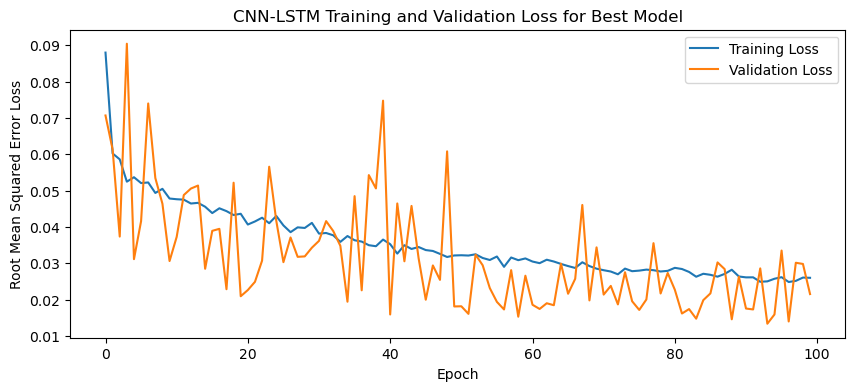

1/1 - 4s - loss: 0.0241 - 4s/epoch - 4s/step
Test Loss: 0.024054108187556267
1/1 [==============================] - 0s 69ms/step


NameError: name 'series' is not defined

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "CNN-LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Specific Humidity\tPredicted Specific Humidity\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

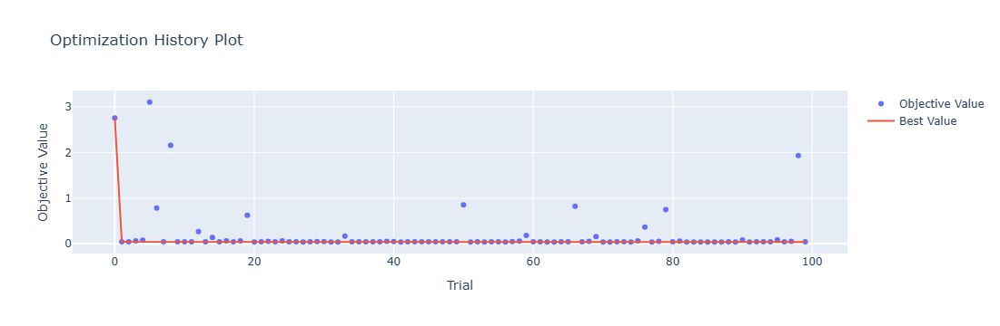

In [4]:
optuna.visualization.plot_optimization_history(study)

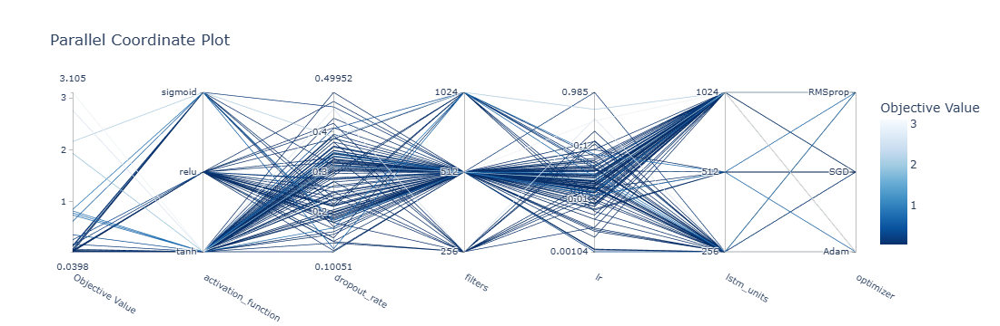

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

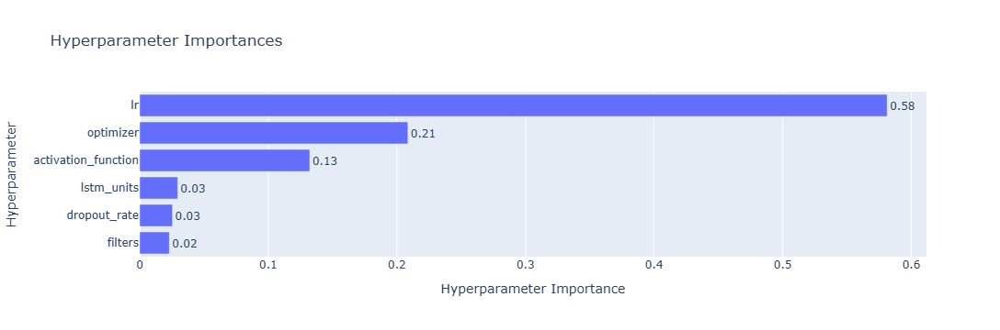

In [6]:
optuna.visualization.plot_param_importances(study)

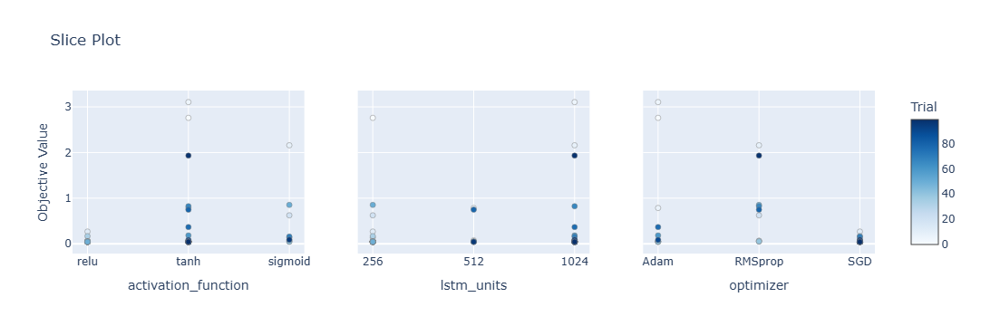

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

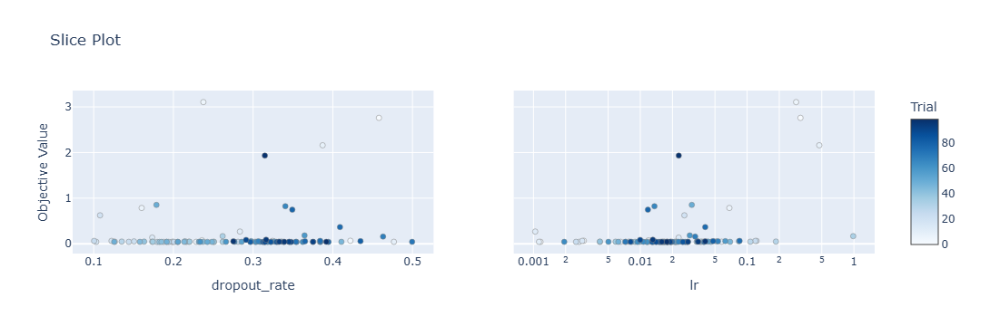

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[ 5.39  4.3   6.51 ... 13.73  8.35  9.05]
 [ 8.03  6.78  8.21 ... 17.14 11.74 12.27]
 [ 5.48  4.27  5.49 ... 13.3   9.17  8.6 ]
 ...
 [ 4.55  3.1   4.22 ... 12.8   7.91  6.65]
 [ 4.44  3.4   5.39 ... 12.34  7.74  6.78]
 [ 4.14  2.75  4.12 ... 10.6   7.07  6.41]]
Epoch 1/100
84/84 [==============================] - 38s 262ms/step - loss: 0.0878 - accuracy: 0.7381 - mae: 0.0784 - rmse: 0.0878 - mape: 14.9218 - pearson: 0.6785 - val_loss: 0.0329 - val_accuracy: 0.9000 - val_mae: 0.0267 - val_rmse: 0.0329 - val_mape: 5.2165 - val_pearson: 0.7760
Epoch 2/100
84/84 [==============================] - 15s 183ms/step - loss: 0.0633 - accuracy: 0.7143 - mae: 0.0547 - rmse: 0.0633 - mape: 10.3550 - pearson: 0.6744 - val_loss: 0.0447 - val_accuracy: 0.9000 - val_mae: 0.0393 - val_rmse: 0.0447 - val_mape: 7.7771 - val_pearson: 0.7568
Epoch 3/100
84/84 [==============================] - 17s 204ms/step - loss: 0.0582 - accuracy: 0.7500 - mae: 0.0502 - rmse: 0.0582 - mape: 9.4480 - pearson: 0.6545 - 

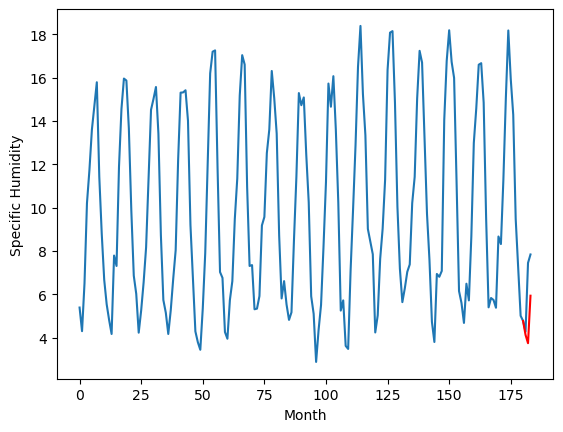

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.74		5.48		-0.26
6.45		5.81		-0.64
8.66		7.19		-1.47
[180, 181, 182, 183]
[7.05, 5.475320323705673, 5.814921214580536, 7.189509465694427]


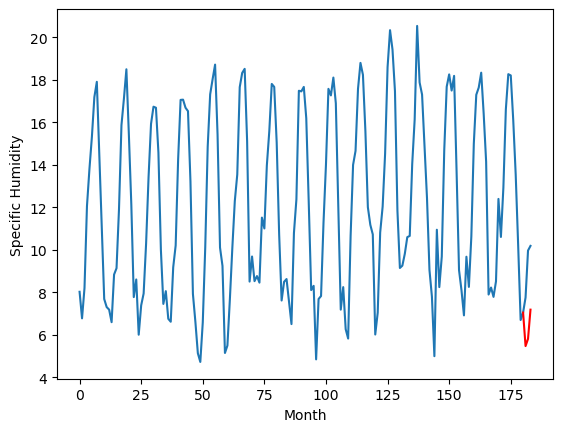

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.41		8.03		-0.38
8.56		8.14		-0.42
10.41		9.61		-0.80
[180, 181, 182, 183]
[5.06, 8.02854536296334, 8.142447790219448, 9.607882222249172]


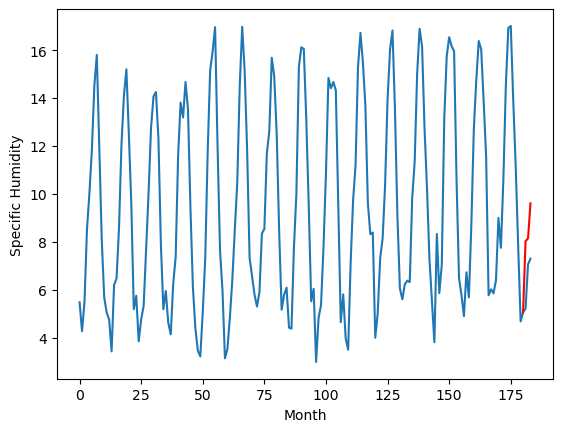

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.55		5.56		0.01
5.46		5.55		0.09
8.91		7.56		-1.35
[180, 181, 182, 183]
[7.05, 5.560933049321175, 5.5508488682284955, 7.560338881351054]


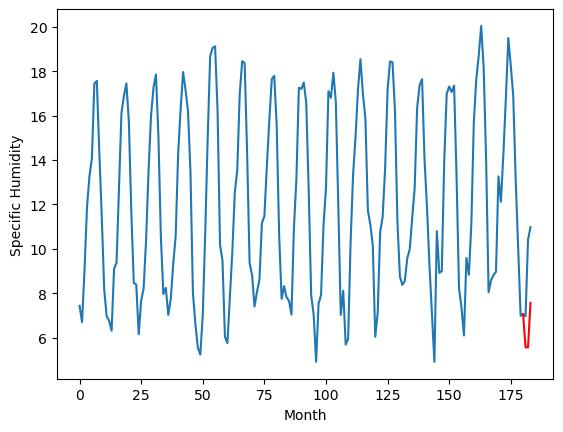

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.36		7.51		0.15
6.96		7.02		0.06
9.80		9.27		-0.53
[180, 181, 182, 183]
[5.2, 7.510536663532257, 7.017896555662155, 9.26878394961357]


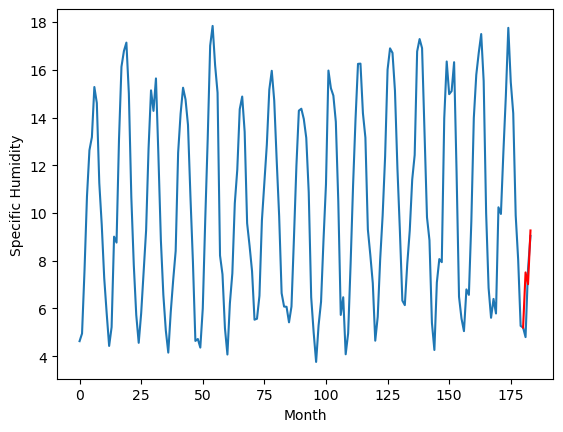

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.02		4.56		0.54
4.61		4.75		0.14
6.18		5.82		-0.36
[180, 181, 182, 183]
[5.16, 4.5594311851263045, 4.749263157248497, 5.821406473517418]


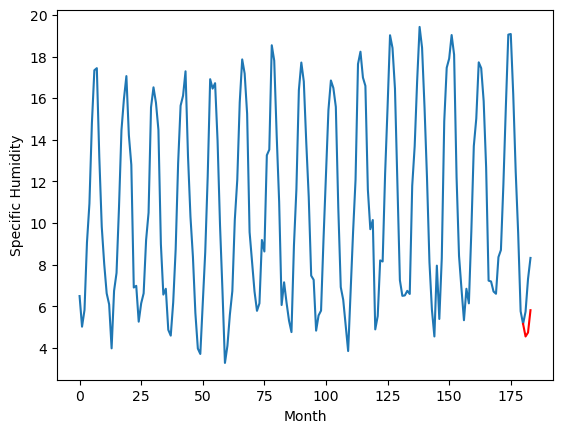

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.35		6.41		0.06
6.40		6.45		0.05
7.99		7.77		-0.22
[180, 181, 182, 183]
[4.05, 6.411114916205406, 6.448086209595203, 7.7667767480015755]


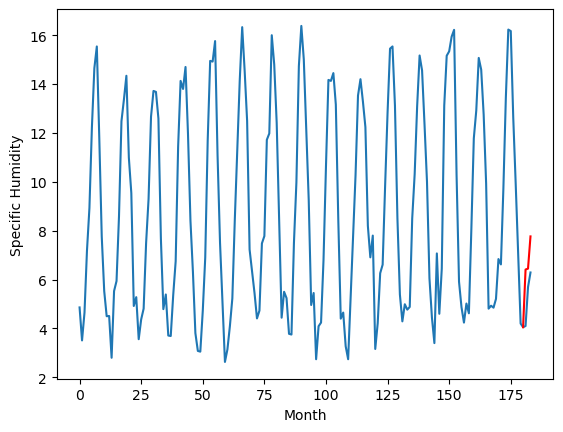

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.55		4.68		0.13
4.58		4.63		0.05
6.20		5.92		-0.28
[180, 181, 182, 183]
[3.64, 4.675526232123375, 4.633863393813372, 5.923635427504778]


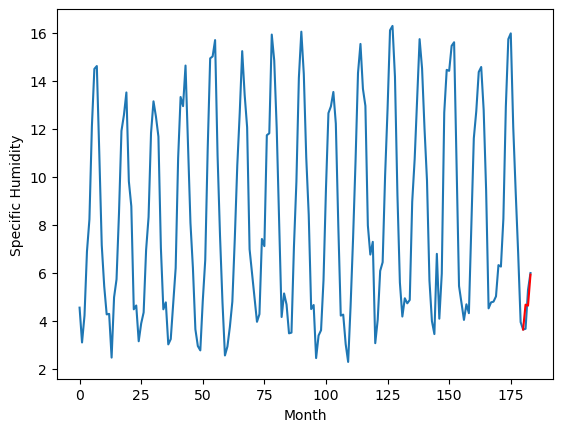

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.32		4.44		0.12
3.64		3.77		0.13
6.70		5.98		-0.72
[180, 181, 182, 183]
[3.46, 4.43891264796257, 3.770735341310501, 5.979434090852737]


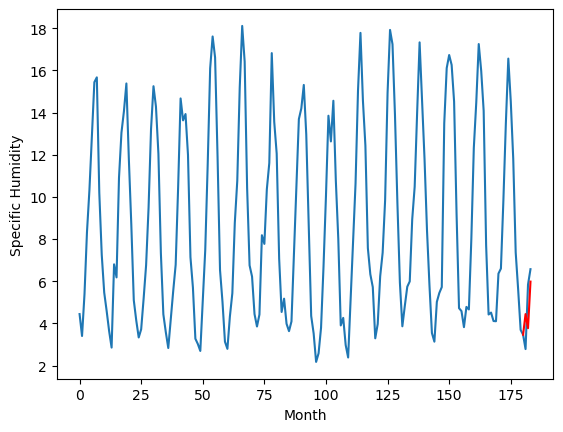

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.11		4.14		0.03
3.66		3.57		-0.09
5.46		5.20		-0.26
[180, 181, 182, 183]
[2.93, 4.141608240604401, 3.5748778605461125, 5.204055073261261]


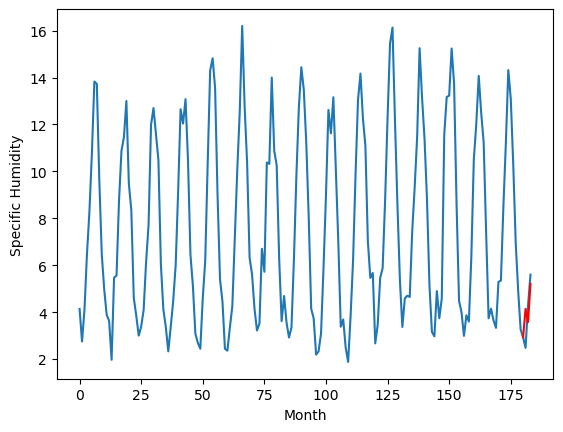

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.76		3.79		0.03
3.02		3.06		0.04
4.64		4.53		-0.11
[180, 181, 182, 183]
[2.74, 3.7907117152214047, 3.055823638439178, 4.526177003383636]


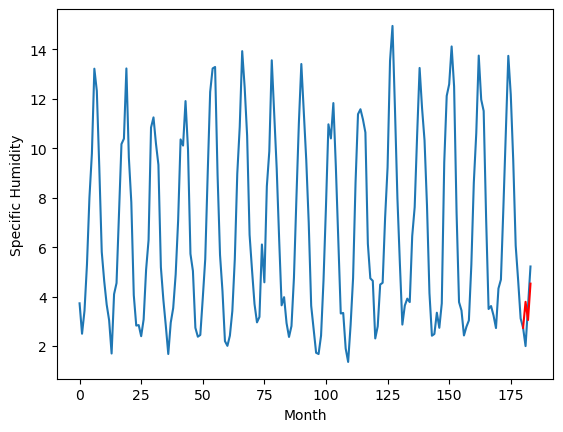

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.90   4.126002
1                 1    5.74   5.475320
2                 2    8.41   8.028545
3                 3    5.55   5.560933
4                 4    7.36   7.510537
5                 5    4.02   4.559431
6                 6    6.35   6.411115
7                 7    4.55   4.675526
8                 8    4.32   4.438913
9                 9    4.11   4.141608
10               10    3.76   3.790712


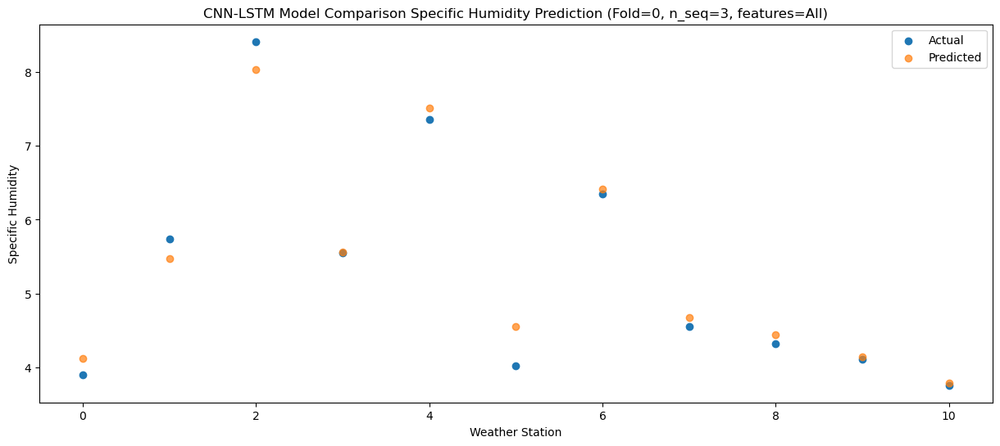

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.41   3.743947
1                 1    6.45   5.814921
2                 2    8.56   8.142448
3                 3    5.46   5.550849
4                 4    6.96   7.017897
5                 5    4.61   4.749263
6                 6    6.40   6.448086
7                 7    4.58   4.633863
8                 8    3.64   3.770735
9                 9    3.66   3.574878
10               10    3.02   3.055824


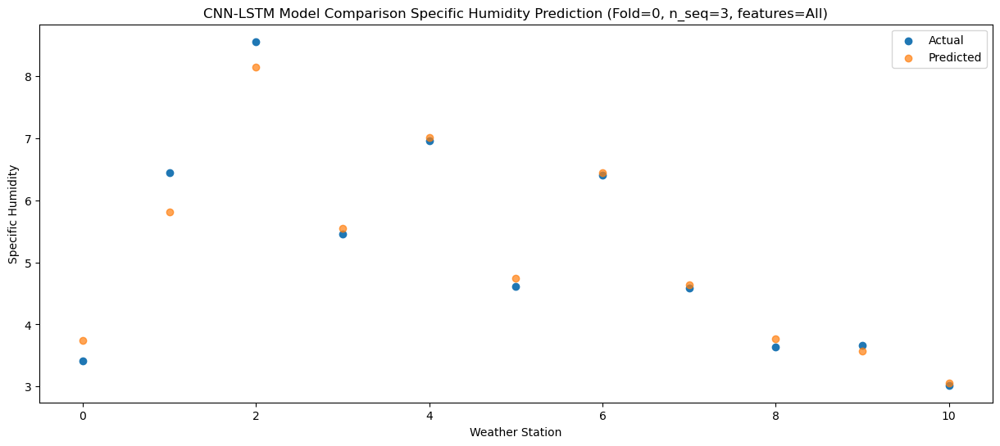

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.58   5.936855
1                 1    8.66   7.189509
2                 2   10.41   9.607882
3                 3    8.91   7.560339
4                 4    9.80   9.268784
5                 5    6.18   5.821406
6                 6    7.99   7.766777
7                 7    6.20   5.923635
8                 8    6.70   5.979434
9                 9    5.46   5.204055
10               10    4.64   4.526177


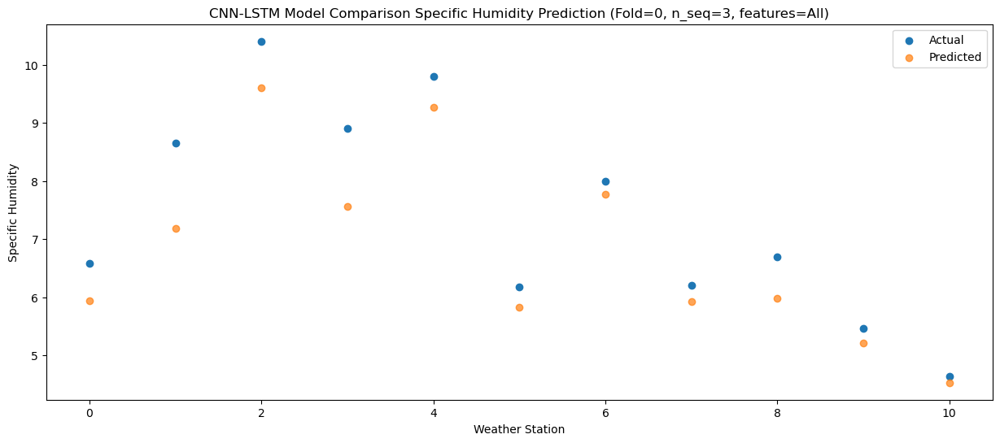

f, t:
[[ 3.9   5.74  8.41  5.55  7.36  4.02  6.35  4.55  4.32  4.11  3.76]
 [ 3.41  6.45  8.56  5.46  6.96  4.61  6.4   4.58  3.64  3.66  3.02]
 [ 6.58  8.66 10.41  8.91  9.8   6.18  7.99  6.2   6.7   5.46  4.64]]
[[4.12600226 5.47532032 8.02854536 5.56093305 7.51053666 4.55943119
  6.41111492 4.67552623 4.43891265 4.14160824 3.79071172]
 [3.74394668 5.81492121 8.14244779 5.55084887 7.01789656 4.74926316
  6.44808621 4.63386339 3.77073534 3.57487786 3.05582364]
 [5.93685473 7.18950947 9.60788222 7.56033888 9.26878395 5.82140647
  7.76677675 5.92363543 5.97943409 5.20405507 4.526177  ]]
Year at t+1:
t+1 SKRMSE: 0.236640
t+1 KRMSE: 0.236640
t+1 MAE: 0.176446
t+1 SKMAPE: 0.035148
t+1 R2_SCORE: 0.974524
t+1 KMAPE: 0.035148
t+1 PEARSON: 0.981558
t+1 AVERAGE ACTUAL: 5.279091
Year at t+2:
t+2 SKRMSE: 0.261296
t+2 KRMSE: 0.261296
t+2 MAE: 0.184383
t+2 SKMAPE: 0.035514
t+2 R2_SCORE: 0.975721
t+2 KMAPE: 0.035514
t+2 PEARSON: 0.981630
t+2 AVERAGE ACTUAL: 5.159091
Year at t+3:
t+3 SKRMSE: 0.749280

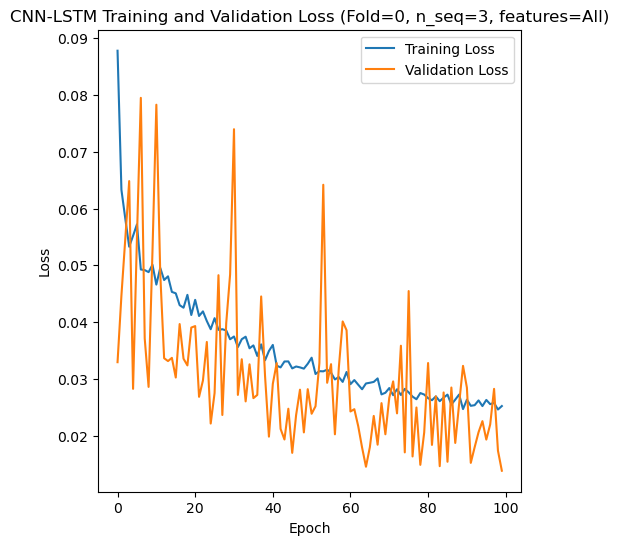

[[ 6.43  5.26  5.95 ... 15.04 10.09  9.76]
 [ 4.92  3.81  4.91 ... 12.52  8.69  7.9 ]
 [ 5.77  4.38  5.81 ... 14.28  9.78  9.52]
 ...
 [ 4.32  3.52  5.54 ... 12.    6.96  7.01]
 [ 3.07  3.12  5.08 ... 11.47  8.11  7.14]
 [ 2.37  2.06  3.5  ...  9.32  6.33  5.39]]
Epoch 1/100
84/84 [==============================] - 41s 254ms/step - loss: 0.0900 - accuracy: 0.7619 - mae: 0.0811 - rmse: 0.0900 - mape: 15.3141 - pearson: 0.6604 - val_loss: 0.0518 - val_accuracy: 0.9000 - val_mae: 0.0436 - val_rmse: 0.0518 - val_mape: 8.0041 - val_pearson: 0.7613
Epoch 2/100
84/84 [==============================] - 17s 197ms/step - loss: 0.0601 - accuracy: 0.7738 - mae: 0.0504 - rmse: 0.0601 - mape: 9.4476 - pearson: 0.6809 - val_loss: 0.0415 - val_accuracy: 0.9000 - val_mae: 0.0365 - val_rmse: 0.0415 - val_mape: 6.9448 - val_pearson: 0.8898
Epoch 3/100
84/84 [==============================] - 16s 195ms/step - loss: 0.0589 - accuracy: 0.7738 - mae: 0.0514 - rmse: 0.0589 - mape: 9.6287 - pearson: 0.7111 - v

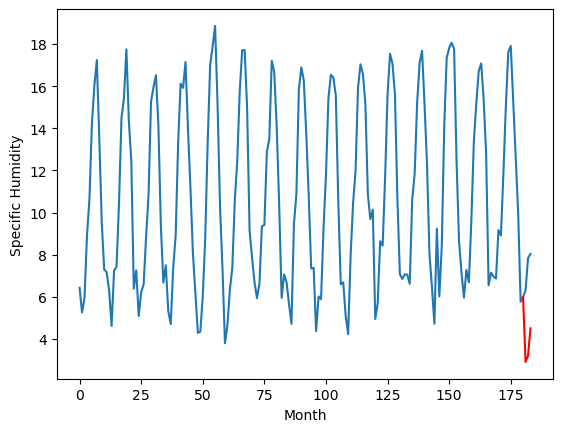

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.45		6.93		0.48
6.64		7.01		0.37
8.17		8.56		0.39
[180, 181, 182, 183]
[4.15, 6.927885227203369, 7.005107745826244, 8.559355125129223]


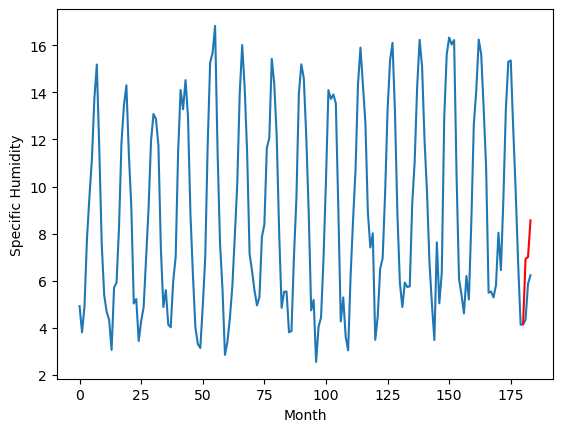

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		5.50		0.43
5.07		5.58		0.51
7.69		7.44		-0.25
[180, 181, 182, 183]
[5.12, 5.503144247531891, 5.581534644663334, 7.441368004381657]


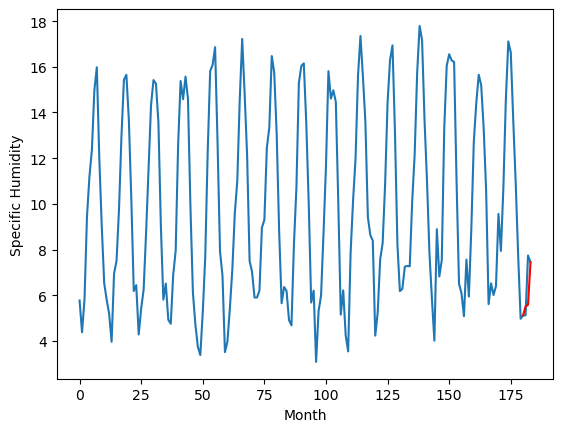

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.43		6.45		1.02
5.50		6.28		0.78
8.14		8.36		0.22
[180, 181, 182, 183]
[6.35, 6.4484800887107845, 6.281806815862655, 8.359448779821395]


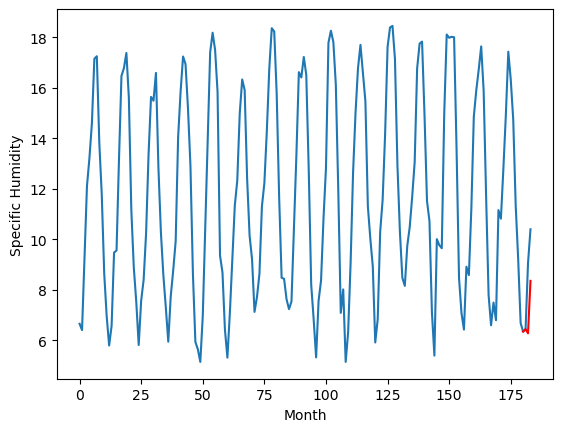

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.41		7.32		0.91
6.45		7.09		0.64
9.17		9.24		0.07
[180, 181, 182, 183]
[6.08, 7.316306862831116, 7.090620402097702, 9.242677811384201]


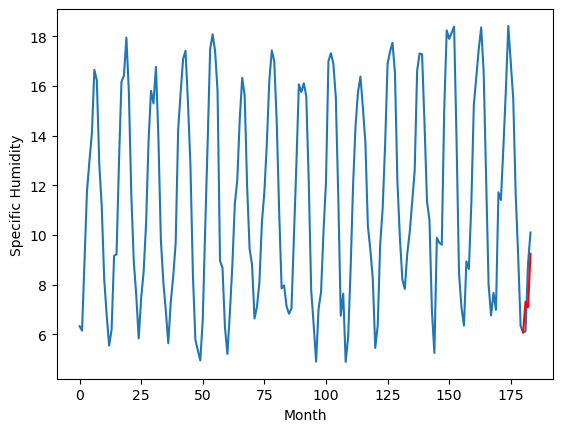

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.16		7.12		-0.04
6.53		6.86		0.33
7.32		8.16		0.84
[180, 181, 182, 183]
[3.92, 7.123263852596283, 6.861332075595856, 8.155379192829132]


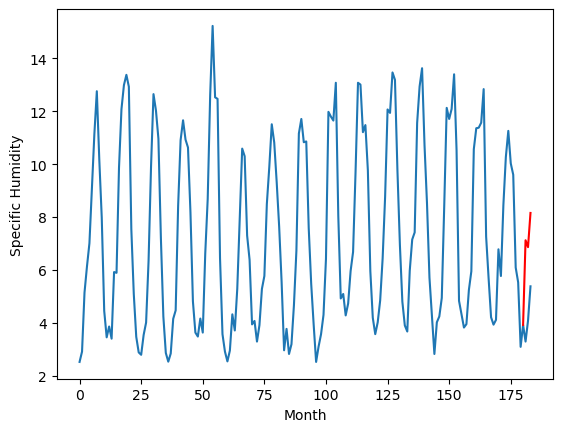

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.41		3.01		0.60
2.53		3.10		0.57
4.09		4.55		0.46
[180, 181, 182, 183]
[4.16, 3.0079080057144165, 3.1045726132392883, 4.554455239772796]


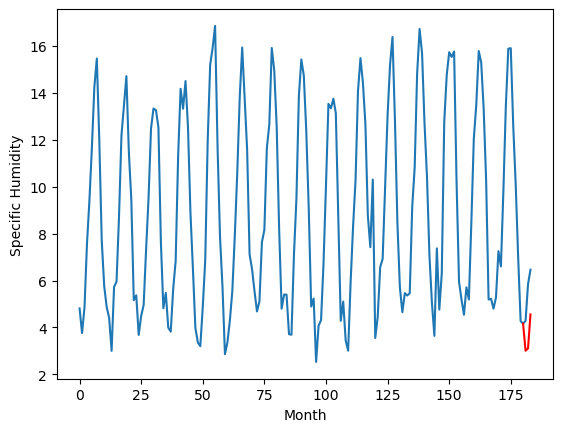

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.68		5.33		0.65
4.16		4.90		0.74
6.89		7.13		0.24
[180, 181, 182, 183]
[3.84, 5.32675397157669, 4.901914176940918, 7.126151142120361]


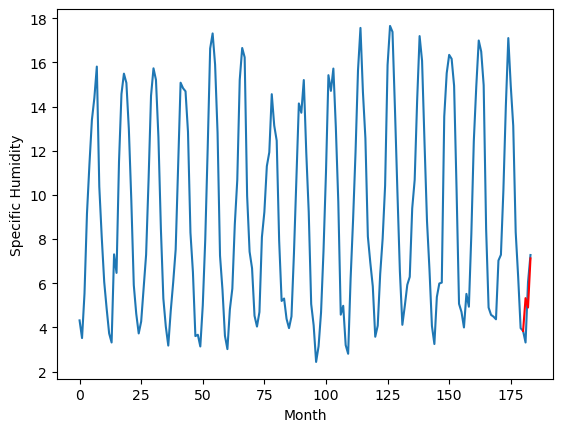

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.96		0.48
3.67		4.36		0.69
6.28		6.44		0.16
[180, 181, 182, 183]
[3.73, 4.957633323669434, 4.360074050426483, 6.438042647838593]


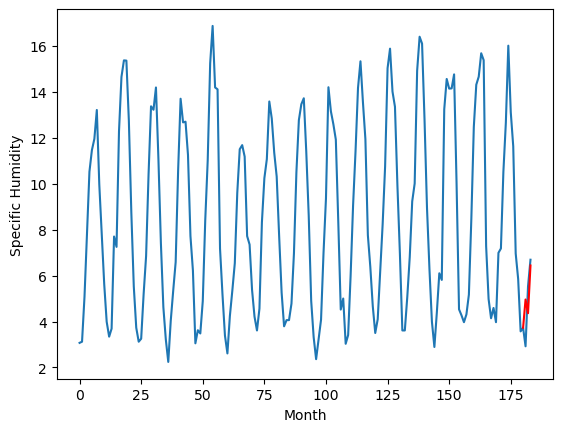

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.26		3.79		0.53
2.52		3.23		0.71
4.34		4.75		0.41
[180, 181, 182, 183]
[2.83, 3.787739403247833, 3.234310574531555, 4.747740097045899]


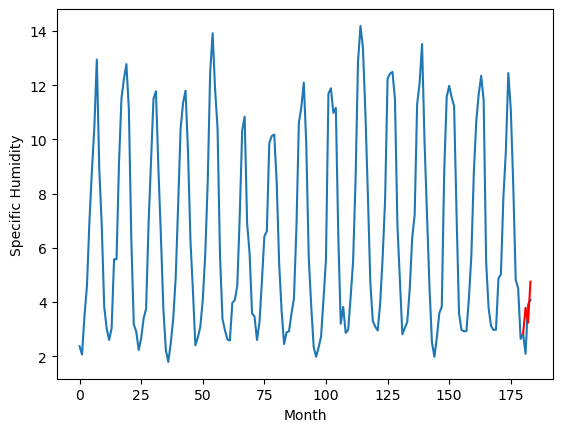

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.64		2.52		0.88
1.68		2.32		0.64
2.92		3.17		0.25
[180, 181, 182, 183]
[2.69, 2.5247898054122926, 2.3175419223308564, 3.170515562295914]


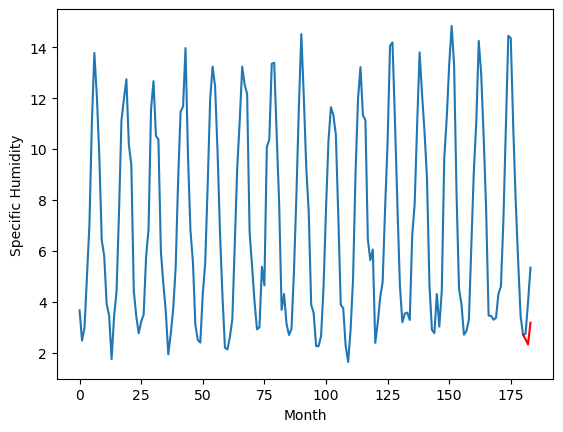

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.59   2.910271
1                 1    6.45   6.927885
2                 2    5.07   5.503144
3                 3    5.43   6.448480
4                 4    6.41   7.316307
5                 5    7.16   7.123264
6                 6    2.41   3.007908
7                 7    4.68   5.326754
8                 8    4.48   4.957633
9                 9    3.26   3.787739
10               10    1.64   2.524790


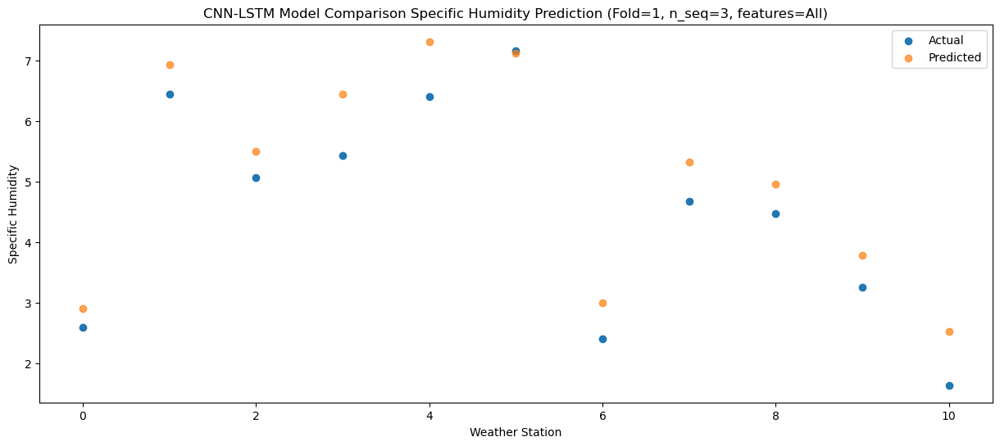

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    2.91   3.196343
1                 1    6.64   7.005108
2                 2    5.07   5.581535
3                 3    5.50   6.281807
4                 4    6.45   7.090620
5                 5    6.53   6.861332
6                 6    2.53   3.104573
7                 7    4.16   4.901914
8                 8    3.67   4.360074
9                 9    2.52   3.234311
10               10    1.68   2.317542


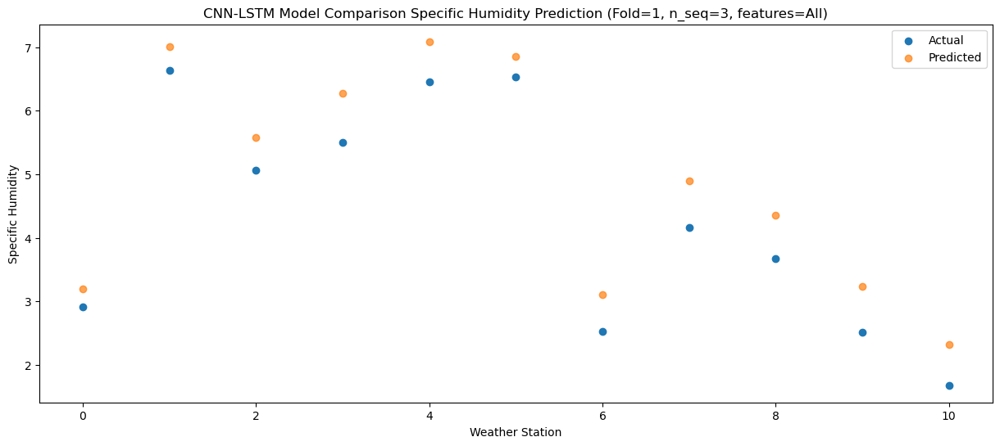

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    4.44   4.502865
1                 1    8.17   8.559355
2                 2    7.69   7.441368
3                 3    8.14   8.359449
4                 4    9.17   9.242678
5                 5    7.32   8.155379
6                 6    4.09   4.554455
7                 7    6.89   7.126151
8                 8    6.28   6.438043
9                 9    4.34   4.747740
10               10    2.92   3.170516


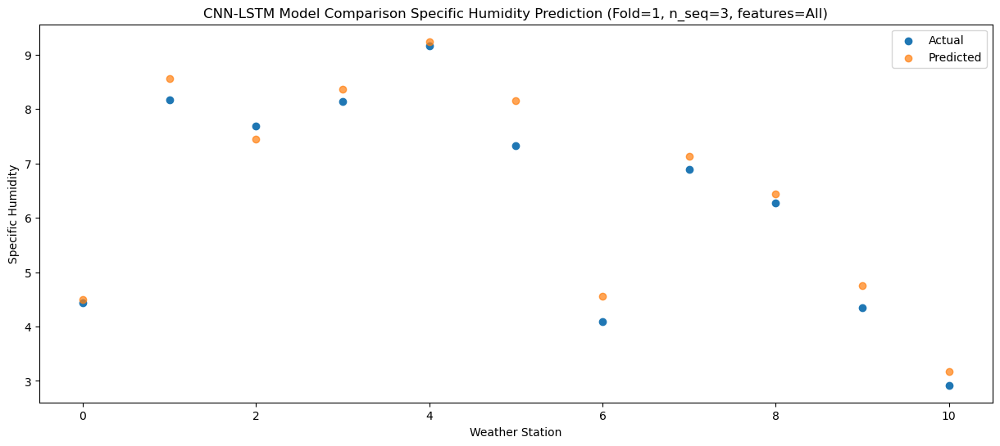

f, t:
[[2.59 6.45 5.07 5.43 6.41 7.16 2.41 4.68 4.48 3.26 1.64]
 [2.91 6.64 5.07 5.5  6.45 6.53 2.53 4.16 3.67 2.52 1.68]
 [4.44 8.17 7.69 8.14 9.17 7.32 4.09 6.89 6.28 4.34 2.92]]
[[2.9102711  6.92788523 5.50314425 6.44848009 7.31630686 7.12326385
  3.00790801 5.32675397 4.95763332 3.7877394  2.52478981]
 [3.19634291 7.00510775 5.58153464 6.28180682 7.0906204  6.86133208
  3.10457261 4.90191418 4.36007405 3.23431057 2.31754192]
 [4.50286456 8.55935513 7.441368   8.35944878 9.24267781 8.15537919
  4.55445524 7.12615114 6.43804265 4.7477401  3.17051556]]
Year at t+1:
t+1 SKRMSE: 0.635602
t+1 KRMSE: 0.635602
t+1 MAE: 0.575241
t+1 SKMAPE: 0.164687
t+1 R2_SCORE: 0.867274
t+1 KMAPE: 0.164687
t+1 PEARSON: 0.973585
t+1 AVERAGE ACTUAL: 4.507273
Year at t+2:
t+2 SKRMSE: 0.594049
t+2 KRMSE: 0.594049
t+2 MAE: 0.570469
t+2 SKMAPE: 0.163901
t+2 R2_SCORE: 0.880949
t+2 KMAPE: 0.163901
t+2 PEARSON: 0.990978
t+2 AVERAGE ACTUAL: 4.332727
Year at t+3:
t+3 SKRMSE: 0.368552
t+3 KRMSE: 0.368552
t+3 MAE: 0.3

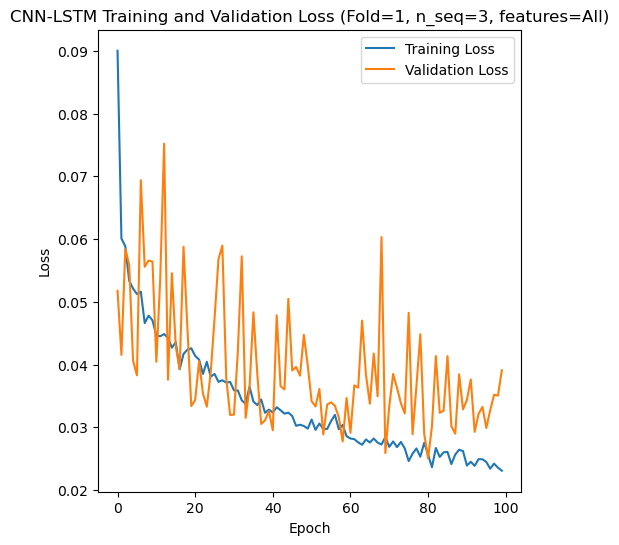

[[ 4.97  3.84  5.83 ... 12.86  8.48  8.25]
 [ 2.46  2.06  3.48 ...  9.57  6.71  5.1 ]
 [ 8.78  8.15  9.01 ... 20.36 15.38 12.95]
 ...
 [ 1.89  2.51  2.73 ...  7.42  4.53  3.35]
 [ 5.04  4.9   5.93 ... 10.09  8.19  4.88]
 [ 5.06  3.79  4.84 ... 13.58  8.96  7.8 ]]
Epoch 1/100
84/84 [==============================] - 42s 260ms/step - loss: 0.0903 - accuracy: 0.6667 - mae: 0.0810 - rmse: 0.0903 - mape: 15.2291 - pearson: 0.5893 - val_loss: 0.0290 - val_accuracy: 1.0000 - val_mae: 0.0253 - val_rmse: 0.0290 - val_mape: 4.9311 - val_pearson: 0.9124
Epoch 2/100
84/84 [==============================] - 15s 178ms/step - loss: 0.0589 - accuracy: 0.8214 - mae: 0.0503 - rmse: 0.0589 - mape: 9.4265 - pearson: 0.6967 - val_loss: 0.0356 - val_accuracy: 1.0000 - val_mae: 0.0283 - val_rmse: 0.0356 - val_mape: 5.2253 - val_pearson: 0.9338
Epoch 3/100
84/84 [==============================] - 15s 179ms/step - loss: 0.0548 - accuracy: 0.7738 - mae: 0.0458 - rmse: 0.0548 - mape: 8.5381 - pearson: 0.7221 - v

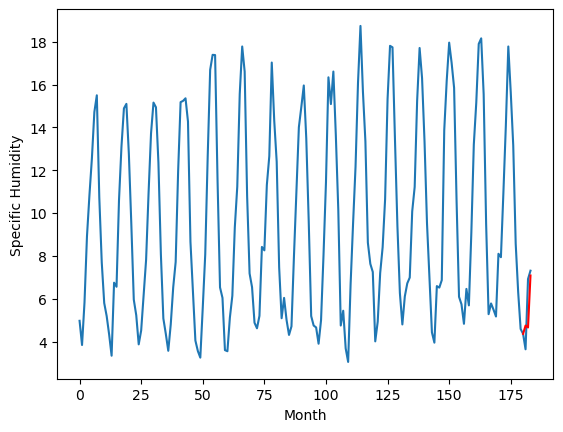

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.92		4.79		-0.13
4.24		4.54		0.30
6.09		6.23		0.14
[180, 181, 182, 183]
[2.82, 4.79123464345932, 4.54302875816822, 6.232331679463386]


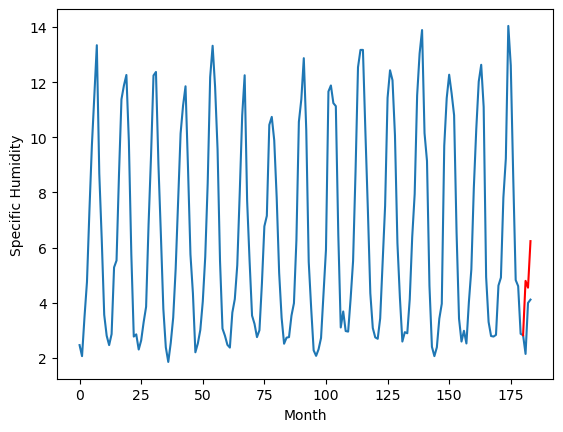

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.95		2.30		-0.65
5.08		3.21		-1.87
5.30		4.27		-1.03
[180, 181, 182, 183]
[9.16, 2.2991937911510467, 3.20761500954628, 4.266284099817276]


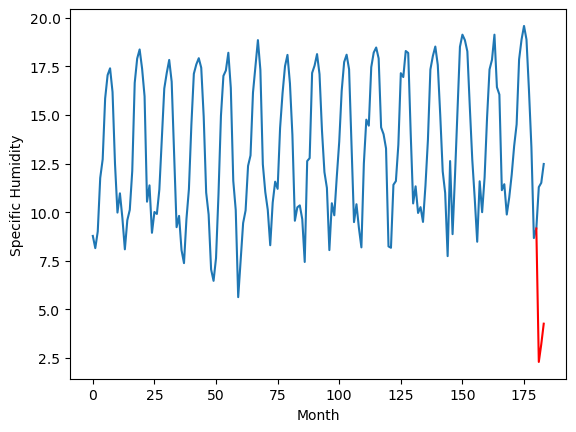

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.70		8.12		0.42
7.87		8.22		0.35
8.51		9.18		0.67
[180, 181, 182, 183]
[2.44, 8.124894647598266, 8.2159288290143, 9.183562195599078]


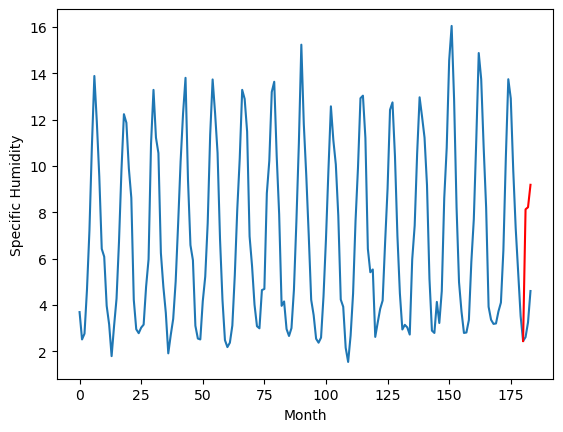

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.82		3.49		-0.33
3.80		3.97		0.17
7.09		6.10		-0.99
[180, 181, 182, 183]
[6.65, 3.4907836639881134, 3.9720742428302764, 6.102401229143142]


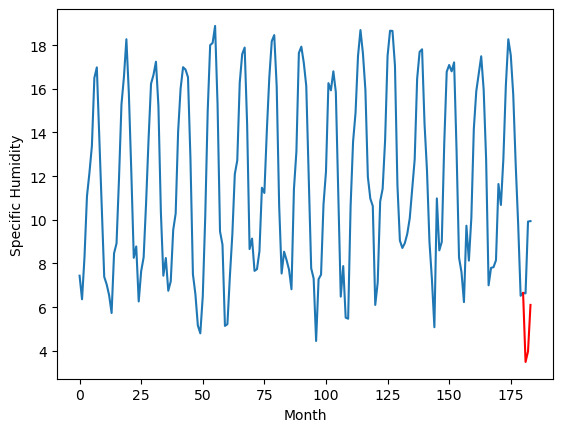

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.31		7.22		-0.09
7.26		7.28		0.02
10.25		9.57		-0.68
[180, 181, 182, 183]
[6.19, 7.216991710066796, 7.277917890399695, 9.56695535644889]


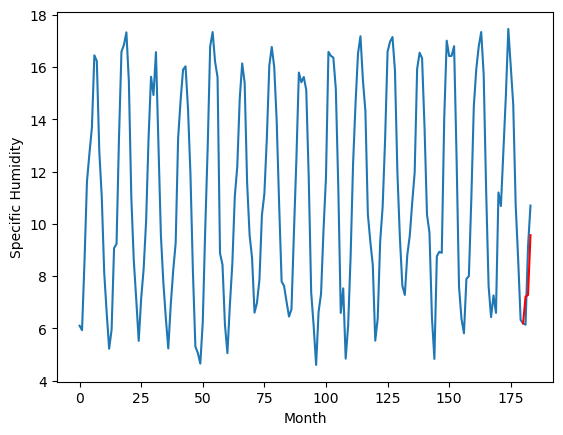

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.00		5.88		-0.12
5.67		5.74		0.07
8.53		8.12		-0.41
[180, 181, 182, 183]
[4.78, 5.875733098387718, 5.737872576713562, 8.122469639778137]


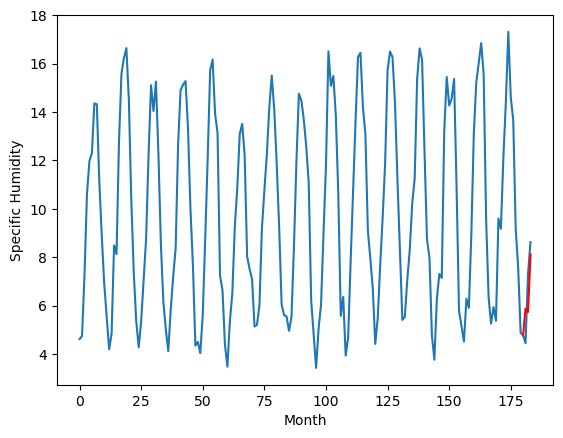

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.57		-0.33
4.77		4.72		-0.05
4.86		5.71		0.85
[180, 181, 182, 183]
[2.61, 4.5741186168789865, 4.7223496463894845, 5.709460857212544]


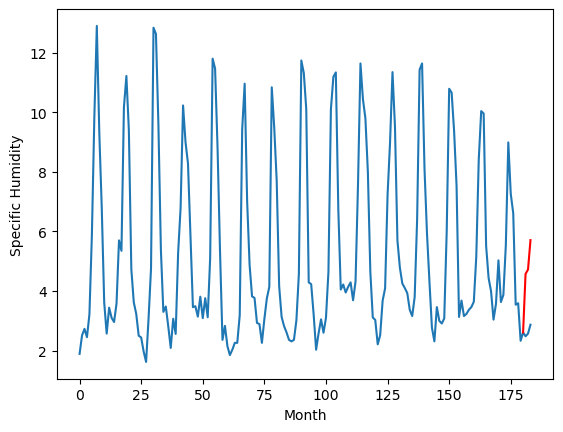

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.74		1.93		-0.81
3.27		2.22		-1.05
3.38		2.55		-0.83
[180, 181, 182, 183]
[4.6, 1.9342701876163482, 2.2193382227420804, 2.5517545187473294]


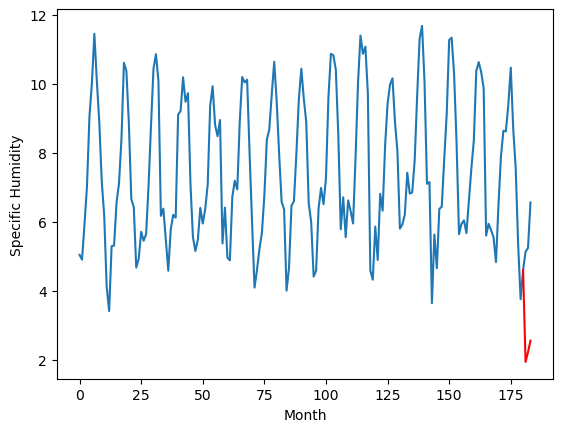

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.92		4.64		-0.28
4.99		4.98		-0.01
6.72		6.71		-0.01
[180, 181, 182, 183]
[4.27, 4.644633420705795, 4.984771885871887, 6.712694206237793]


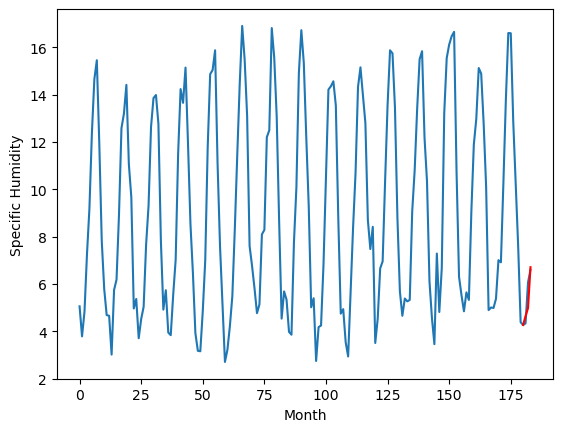

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		4.61		-0.46
5.31		4.83		-0.48
6.34		6.58		0.24
[180, 181, 182, 183]
[3.91, 4.607025173902511, 4.8309749490022655, 6.578010094761848]


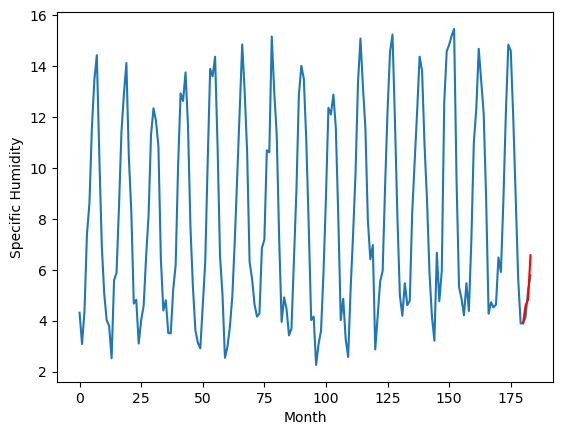

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.83   4.747991
1                 1    4.92   4.791235
2                 2    2.95   2.299194
3                 3    7.70   8.124895
4                 4    3.82   3.490784
5                 5    7.31   7.216992
6                 6    6.00   5.875733
7                 7    4.90   4.574119
8                 8    2.74   1.934270
9                 9    4.92   4.644633
10               10    5.07   4.607025


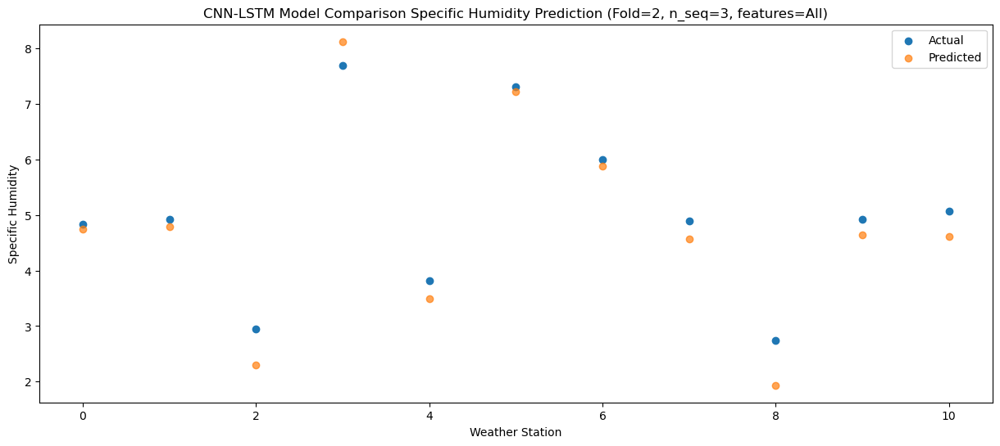

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.11   4.658693
1                 1    4.24   4.543029
2                 2    5.08   3.207615
3                 3    7.87   8.215929
4                 4    3.80   3.972074
5                 5    7.26   7.277918
6                 6    5.67   5.737873
7                 7    4.77   4.722350
8                 8    3.27   2.219338
9                 9    4.99   4.984772
10               10    5.31   4.830975


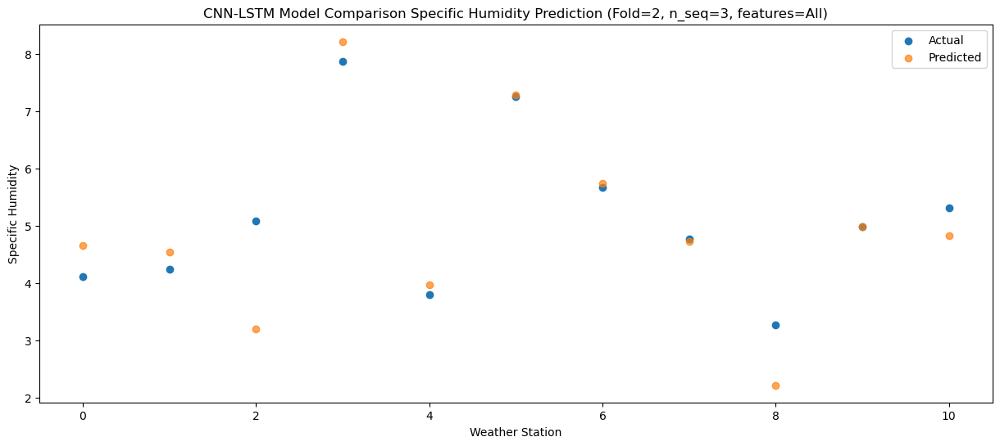

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.39   7.084456
1                 1    6.09   6.232332
2                 2    5.30   4.266284
3                 3    8.51   9.183562
4                 4    7.09   6.102401
5                 5   10.25   9.566955
6                 6    8.53   8.122470
7                 7    4.86   5.709461
8                 8    3.38   2.551755
9                 9    6.72   6.712694
10               10    6.34   6.578010


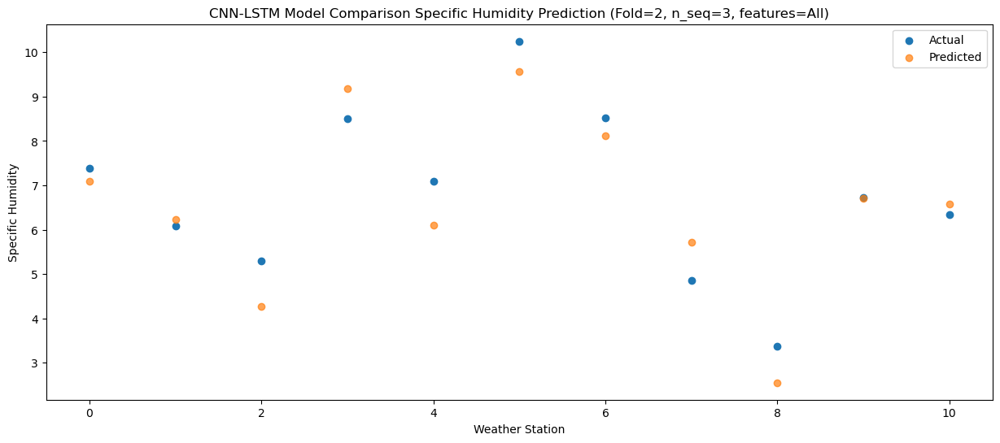

f, t:
[[ 4.83  4.92  2.95  7.7   3.82  7.31  6.    4.9   2.74  4.92  5.07]
 [ 4.11  4.24  5.08  7.87  3.8   7.26  5.67  4.77  3.27  4.99  5.31]
 [ 7.39  6.09  5.3   8.51  7.09 10.25  8.53  4.86  3.38  6.72  6.34]]
[[4.74799096 4.79123464 2.29919379 8.12489465 3.49078366 7.21699171
  5.8757331  4.57411862 1.93427019 4.64463342 4.60702517]
 [4.65869327 4.54302876 3.20761501 8.21592883 3.97207424 7.27791789
  5.73787258 4.72234965 2.21933822 4.98477189 4.83097495]
 [7.08445569 6.23233168 4.2662841  9.1835622  6.10240123 9.56695536
  8.12246964 5.70946086 2.55175452 6.71269421 6.57801009]]
Year at t+1:
t+1 SKRMSE: 0.405131
t+1 KRMSE: 0.405131
t+1 MAE: 0.336629
t+1 SKMAPE: 0.086038
t+1 R2_SCORE: 0.925955
t+1 KMAPE: 0.086038
t+1 PEARSON: 0.992512
t+1 AVERAGE ACTUAL: 5.014545
Year at t+2:
t+2 SKRMSE: 0.699907
t+2 KRMSE: 0.699907
t+2 MAE: 0.446406
t+2 SKMAPE: 0.099980
t+2 R2_SCORE: 0.724804
t+2 KMAPE: 0.099980
t+2 PEARSON: 0.830209
t+2 AVERAGE ACTUAL: 5.124545
Year at t+3:
t+3 SKRMSE: 0.654226

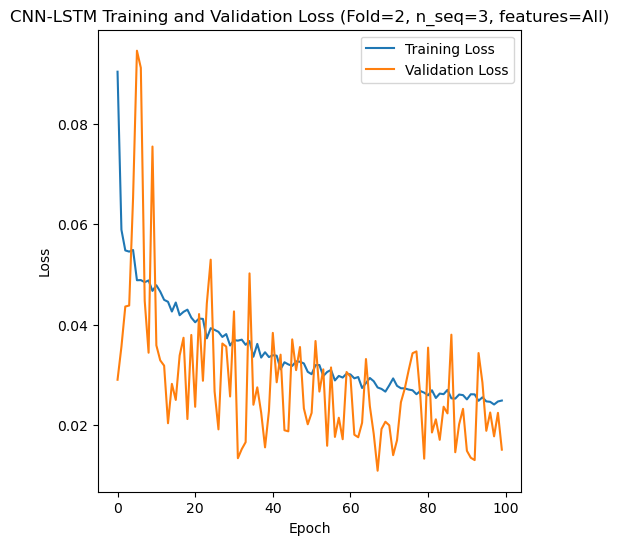

[[ 5.11  3.7   4.74 ... 13.5   8.68  7.66]
 [ 3.73  2.91  5.05 ... 11.19  6.96  6.57]
 [ 5.56  5.41  5.55 ...  8.56  7.45  5.59]
 ...
 [ 2.73  2.21  3.23 ...  5.    3.95  3.09]
 [ 5.93  5.59  5.49 ...  8.63  7.04  6.11]
 [ 3.71  2.55  2.84 ...  9.78  6.68  4.77]]
Epoch 1/100
84/84 [==============================] - 43s 219ms/step - loss: 0.0899 - accuracy: 0.7381 - mae: 0.0814 - rmse: 0.0899 - mape: 15.3725 - pearson: 0.6124 - val_loss: 0.0597 - val_accuracy: 0.8000 - val_mae: 0.0506 - val_rmse: 0.0597 - val_mape: 10.0334 - val_pearson: 0.7544
Epoch 2/100
84/84 [==============================] - 12s 139ms/step - loss: 0.0661 - accuracy: 0.8095 - mae: 0.0575 - rmse: 0.0661 - mape: 10.9120 - pearson: 0.6399 - val_loss: 0.0570 - val_accuracy: 0.8000 - val_mae: 0.0461 - val_rmse: 0.0570 - val_mape: 8.5827 - val_pearson: 0.8482
Epoch 3/100
84/84 [==============================] - 12s 139ms/step - loss: 0.0603 - accuracy: 0.8452 - mae: 0.0518 - rmse: 0.0603 - mape: 9.7705 - pearson: 0.7108 -

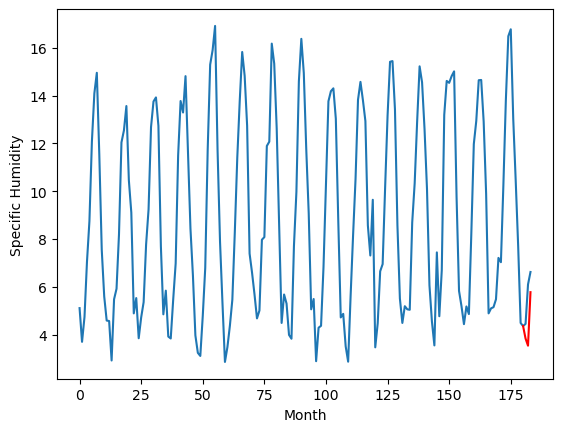

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.02		5.37		0.35
4.46		4.40		-0.06
6.97		7.59		0.62
[180, 181, 182, 183]
[3.43, 5.368506745100022, 4.401651099920273, 7.592747882604599]


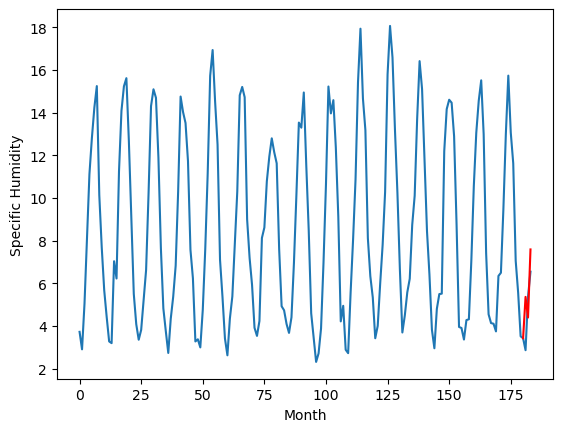

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.17		4.18		0.01
4.11		3.84		-0.27
4.19		4.64		0.45
[180, 181, 182, 183]
[5.43, 4.176631968021393, 3.8381992685794835, 4.636835585832596]


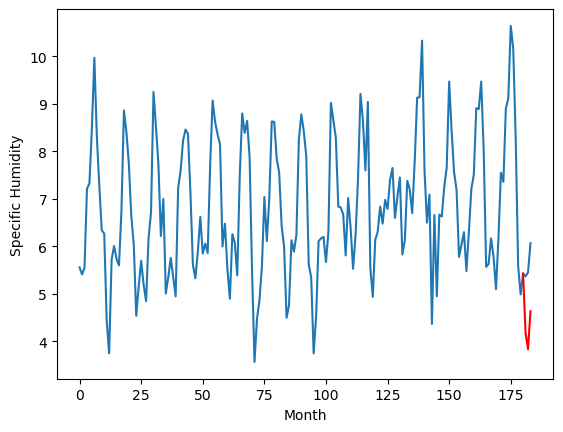

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.29		5.57		0.28
5.22		4.89		-0.33
6.52		7.29		0.77
[180, 181, 182, 183]
[3.21, 5.573588573783636, 4.888095640987157, 7.290674710124731]


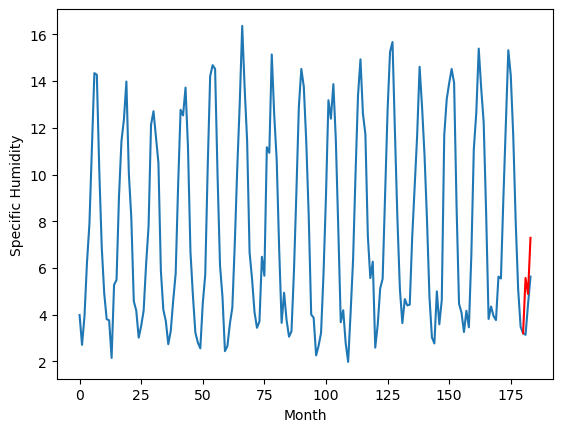

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.79		4.13		0.34
2.96		3.10		0.14
5.44		5.98		0.54
[180, 181, 182, 183]
[3.04, 4.127701839208603, 3.0973853671550753, 5.984294136762619]


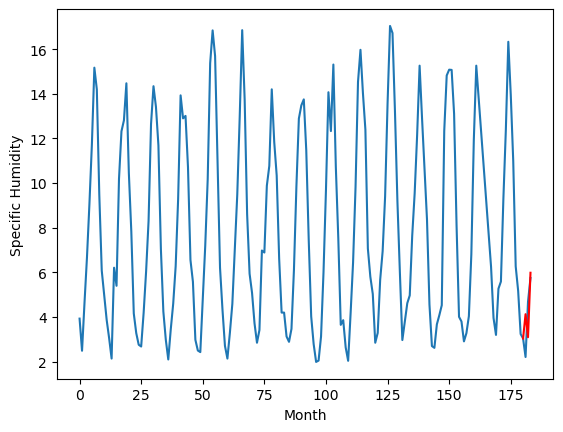

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.62		3.98		0.36
3.10		3.04		-0.06
5.13		5.77		0.64
[180, 181, 182, 183]
[2.91, 3.981327116787434, 3.042233765423298, 5.770135939419269]


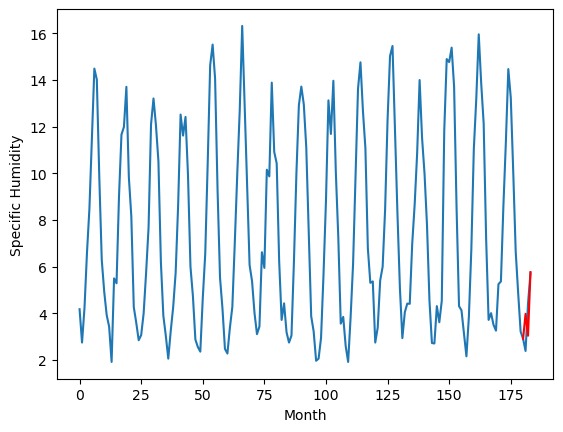

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.35		4.51		0.16
4.41		4.00		-0.41
4.72		5.46		0.74
[180, 181, 182, 183]
[1.6, 4.5100412893295285, 4.004118018150329, 5.455300025939941]


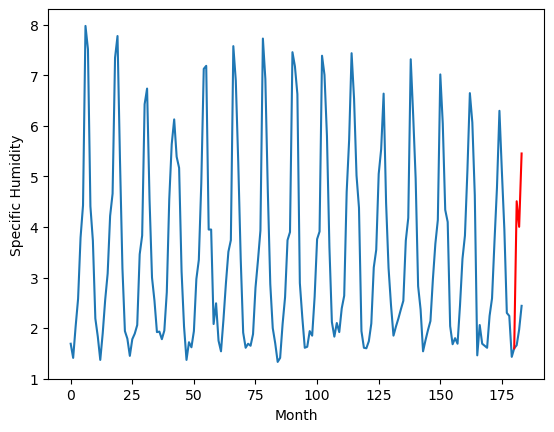

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.50		2.09		-0.41
2.02		1.64		-0.38
2.32		2.69		0.37
[180, 181, 182, 183]
[2.86, 2.090266796350479, 1.6420133435726165, 2.691083344221115]


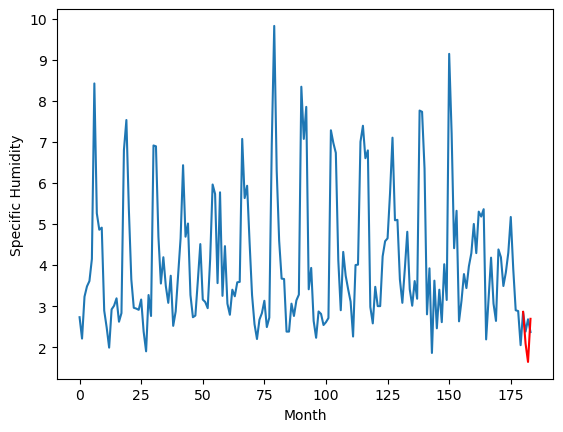

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.40		3.19		-0.21
3.05		2.91		-0.14
2.70		3.80		1.10
[180, 181, 182, 183]
[5.65, 3.1935294675827026, 2.9075425672531128, 3.802919487953186]


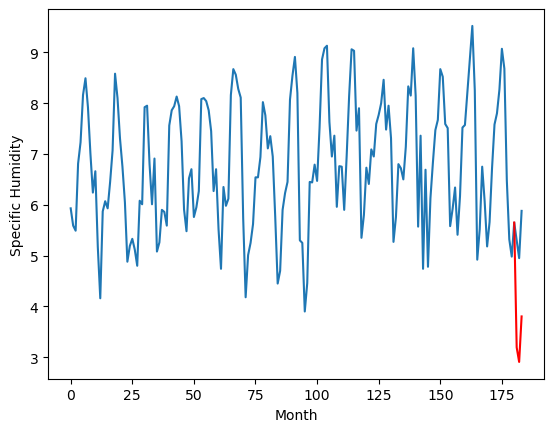

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		5.82		0.98
4.99		5.36		0.37
5.77		6.80		1.03
[180, 181, 182, 183]
[2.54, 5.815326832532882, 5.358409516811371, 6.795346848964691]


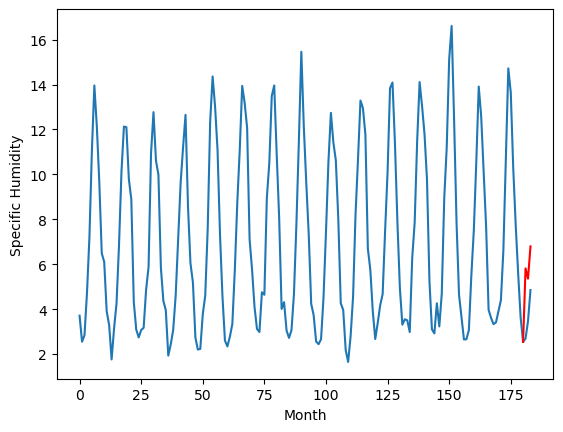

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.02		3.56		0.54
2.88		3.02		0.14
4.16		4.71		0.55
[180, 181, 182, 183]
[2.51, 3.564941189289093, 3.0169186210632324, 4.711599550247192]


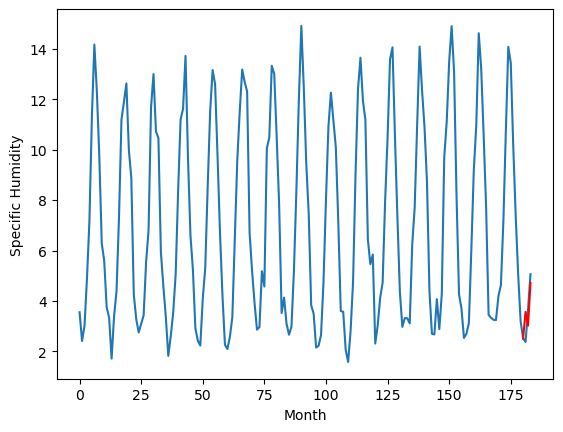

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.58   3.837765
1                 1    5.02   5.368507
2                 2    4.17   4.176632
3                 3    5.29   5.573589
4                 4    3.79   4.127702
5                 5    3.62   3.981327
6                 6    4.35   4.510041
7                 7    2.50   2.090267
8                 8    3.40   3.193529
9                 9    4.84   5.815327
10               10    3.02   3.564941


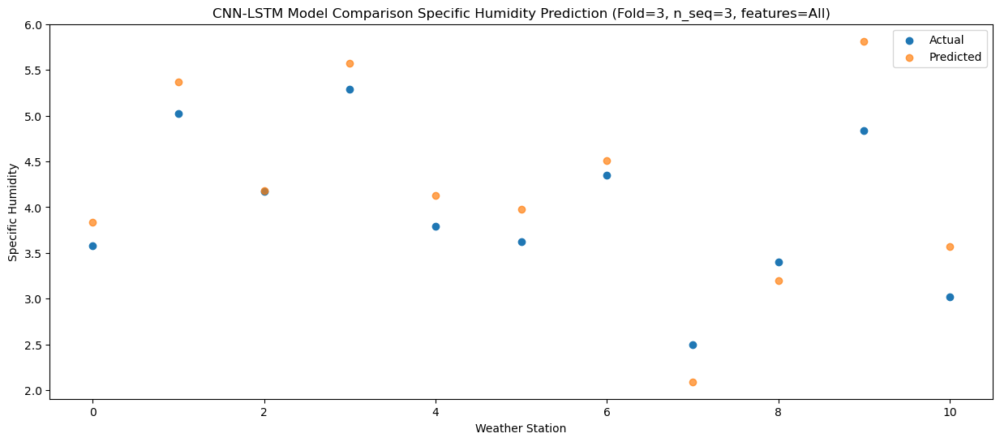

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   3.538563
1                 1    4.46   4.401651
2                 2    4.11   3.838199
3                 3    5.22   4.888096
4                 4    2.96   3.097385
5                 5    3.10   3.042234
6                 6    4.41   4.004118
7                 7    2.02   1.642013
8                 8    3.05   2.907543
9                 9    4.99   5.358410
10               10    2.88   3.016919


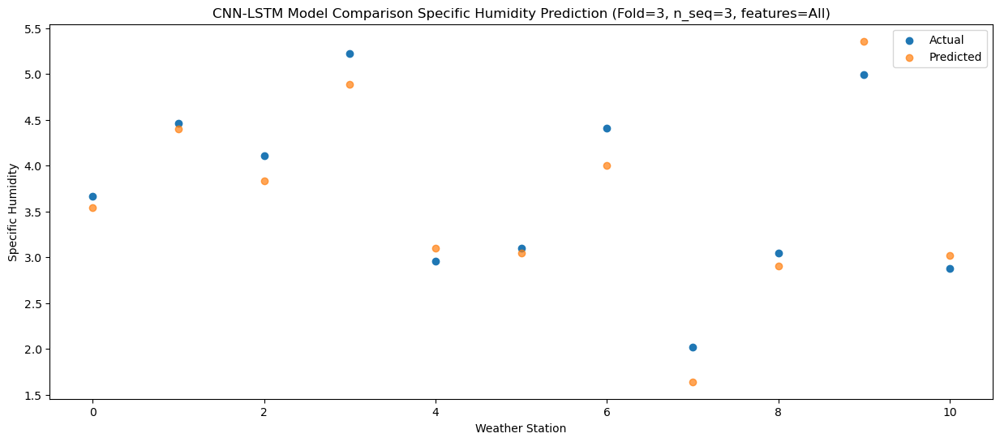

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    5.32   5.776741
1                 1    6.97   7.592748
2                 2    4.19   4.636836
3                 3    6.52   7.290675
4                 4    5.44   5.984294
5                 5    5.13   5.770136
6                 6    4.72   5.455300
7                 7    2.32   2.691083
8                 8    2.70   3.802919
9                 9    5.77   6.795347
10               10    4.16   4.711600


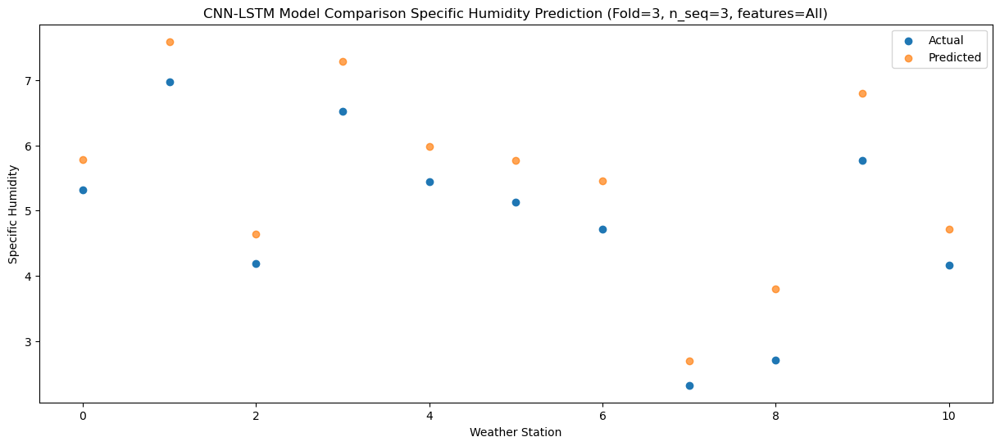

f, t:
[[3.58 5.02 4.17 5.29 3.79 3.62 4.35 2.5  3.4  4.84 3.02]
 [3.67 4.46 4.11 5.22 2.96 3.1  4.41 2.02 3.05 4.99 2.88]
 [5.32 6.97 4.19 6.52 5.44 5.13 4.72 2.32 2.7  5.77 4.16]]
[[3.83776519 5.36850675 4.17663197 5.57358857 4.12770184 3.98132712
  4.51004129 2.0902668  3.19352947 5.81532683 3.56494119]
 [3.53856278 4.4016511  3.83819927 4.88809564 3.09738537 3.04223377
  4.00411802 1.64201334 2.90754257 5.35840952 3.01691862]
 [5.7767408  7.59274788 4.63683559 7.29067471 5.98429414 5.77013594
  5.45530003 2.69108334 3.80291949 6.79534685 4.71159955]]
Year at t+1:
t+1 SKRMSE: 0.426115
t+1 KRMSE: 0.426115
t+1 MAE: 0.353821
t+1 SKMAPE: 0.093537
t+1 R2_SCORE: 0.733007
t+1 KMAPE: 0.093537
t+1 PEARSON: 0.915276
t+1 AVERAGE ACTUAL: 3.961818
Year at t+2:
t+2 SKRMSE: 0.253934
t+2 KRMSE: 0.253934
t+2 MAE: 0.220027
t+2 SKMAPE: 0.062809
t+2 R2_SCORE: 0.929404
t+2 KMAPE: 0.062809
t+2 PEARSON: 0.945417
t+2 AVERAGE ACTUAL: 3.715455
Year at t+3:
t+3 SKRMSE: 0.697167
t+3 KRMSE: 0.697167
t+3 MAE: 0.6

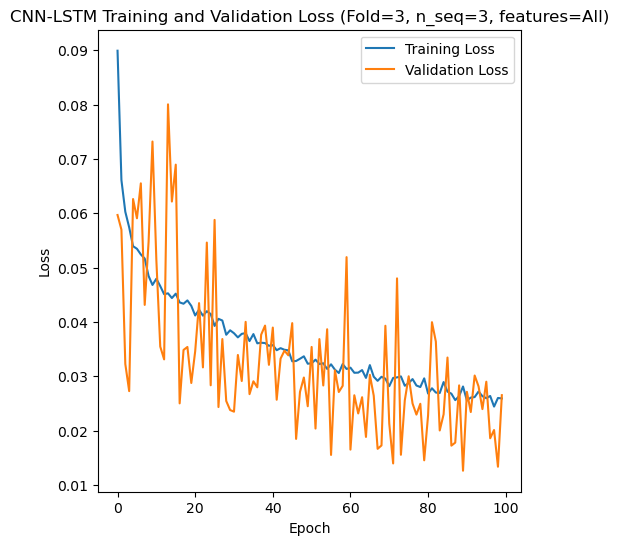

[[ 3.4   2.19  4.28 ... 10.54  6.41  5.39]
 [ 7.94  7.22  7.86 ... 18.27 13.85 11.85]
 [ 5.92  4.91  6.84 ... 14.38  9.59 10.48]
 ...
 [ 3.92  3.    4.93 ... 11.51  7.19  6.46]
 [ 3.98  2.61  4.   ... 10.23  6.65  5.8 ]
 [ 3.84  2.35  4.25 ... 10.6   6.5   5.9 ]]
Epoch 1/100
84/84 [==============================] - 42s 237ms/step - loss: 0.0882 - accuracy: 0.6905 - mae: 0.0788 - rmse: 0.0882 - mape: 14.8288 - pearson: 0.6308 - val_loss: 0.0426 - val_accuracy: 0.9000 - val_mae: 0.0344 - val_rmse: 0.0426 - val_mape: 6.2274 - val_pearson: 0.6443
Epoch 2/100
84/84 [==============================] - 11s 133ms/step - loss: 0.0611 - accuracy: 0.7143 - mae: 0.0536 - rmse: 0.0611 - mape: 10.2012 - pearson: 0.6738 - val_loss: 0.0613 - val_accuracy: 0.9000 - val_mae: 0.0522 - val_rmse: 0.0613 - val_mape: 10.0284 - val_pearson: 0.7537
Epoch 3/100
84/84 [==============================] - 12s 141ms/step - loss: 0.0586 - accuracy: 0.8214 - mae: 0.0502 - rmse: 0.0586 - mape: 9.4949 - pearson: 0.7132 -

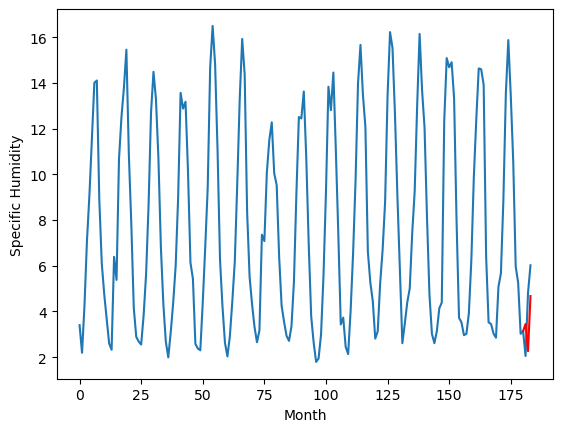

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.75		3.27		-0.48
5.74		3.47		-2.27
5.71		4.47		-1.24
[180, 181, 182, 183]
[7.79, 3.2650547564029693, 3.466644802689552, 4.468845883011818]


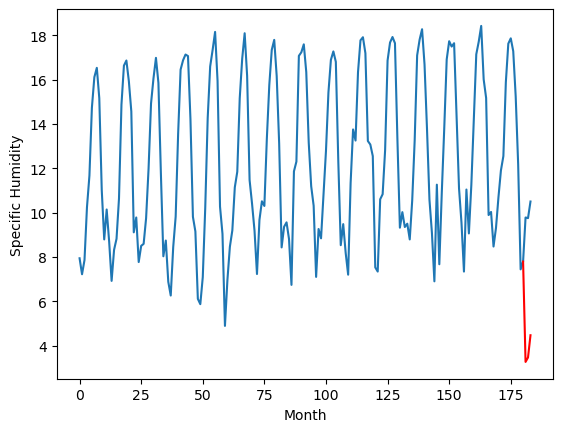

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.83		7.67		-0.16
7.71		7.09		-0.62
10.77		9.67		-1.10
[180, 181, 182, 183]
[5.03, 7.674496414661408, 7.0915675187110905, 9.674337389469148]


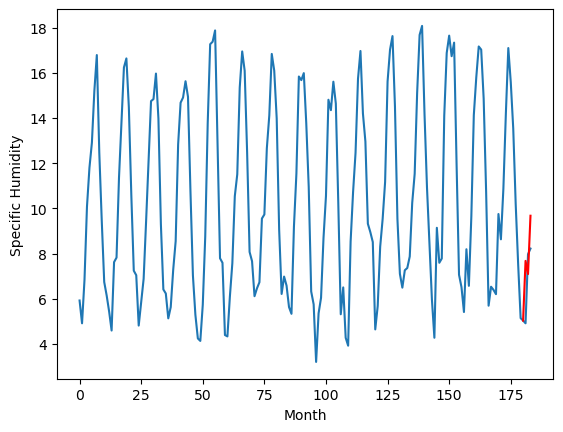

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.81		5.66		-0.15
5.49		4.67		-0.82
8.15		7.37		-0.78
[180, 181, 182, 183]
[4.41, 5.661645812988281, 4.672345263957977, 7.368656737804413]


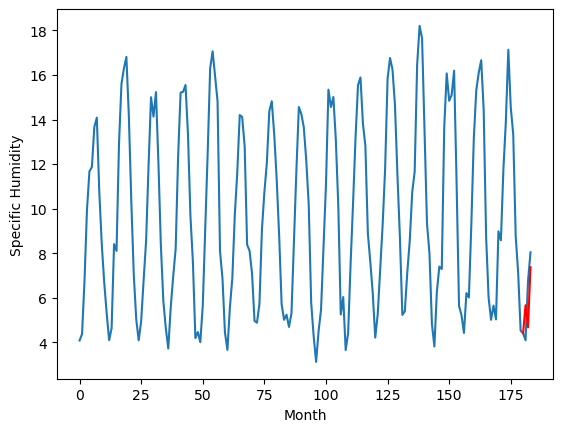

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.04		3.83		-0.21
3.59		2.84		-0.75
6.17		5.45		-0.72
[180, 181, 182, 183]
[4.29, 3.8294656443595887, 2.8384441900253297, 5.4469596910476685]


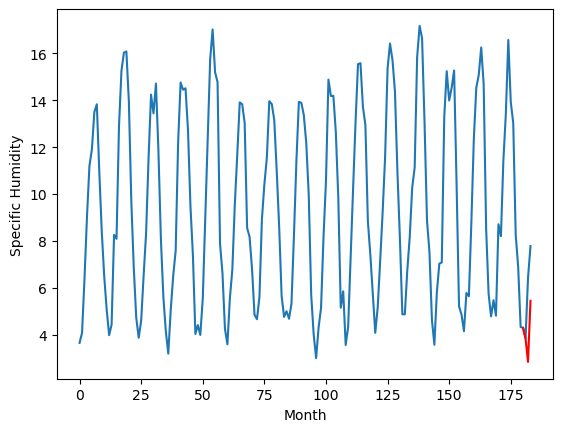

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.35		3.55		-0.80
3.71		2.81		-0.90
5.20		4.37		-0.83
[180, 181, 182, 183]
[3.47, 3.552674861252308, 2.807376952469349, 4.3686238244175915]


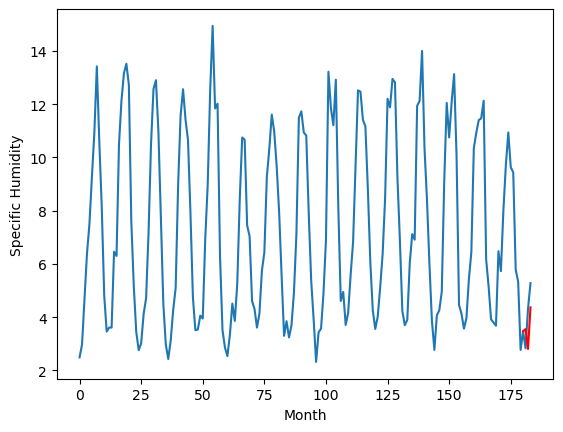

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.37		2.10		-0.27
2.62		1.78		-0.84
4.33		3.45		-0.88
[180, 181, 182, 183]
[4.52, 2.0985148453712466, 1.7783607149124148, 3.449510087966919]


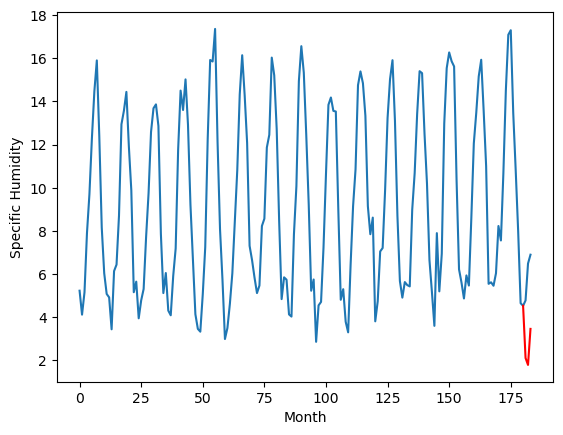

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		4.86		-0.21
4.44		3.86		-0.58
6.81		6.38		-0.43
[180, 181, 182, 183]
[3.4, 4.85774374127388, 3.8553756487369535, 6.3833414328098295]


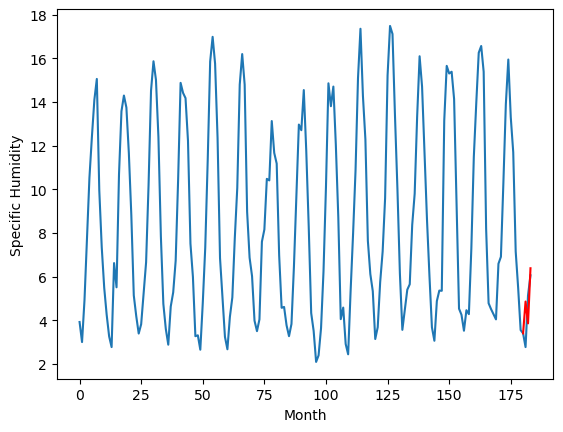

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.57		3.34		-0.23
3.00		2.33		-0.67
4.94		4.30		-0.64
[180, 181, 182, 183]
[2.82, 3.3369004559516906, 2.330207450389862, 4.296545965671539]


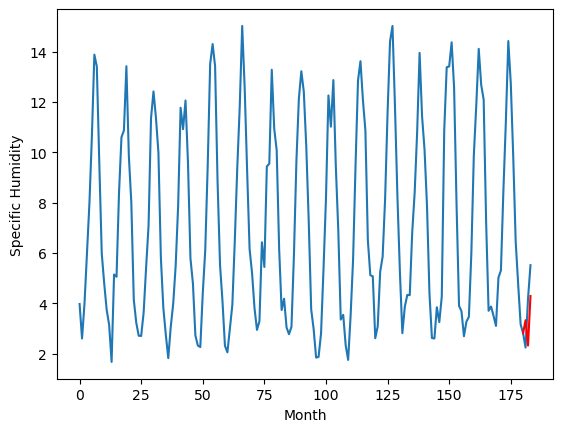

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.66		3.47		-0.19
3.02		2.31		-0.71
5.39		4.61		-0.78
[180, 181, 182, 183]
[2.86, 3.4745262670516968, 2.31052921295166, 4.610671501159668]


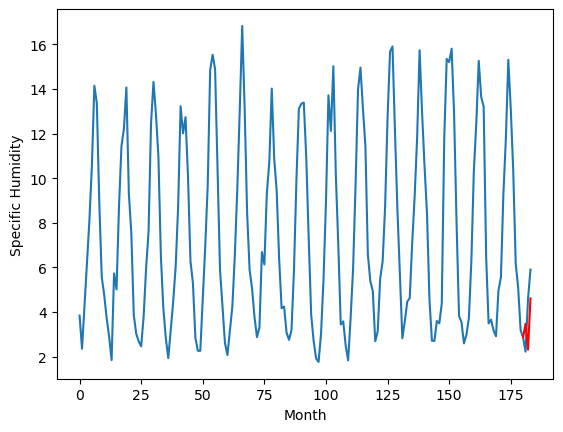

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.46		3.12		-0.34
2.89		2.27		-0.62
4.18		3.69		-0.49
[180, 181, 182, 183]
[2.61, 3.121557500362396, 2.2744926476478575, 3.6905435585975646]


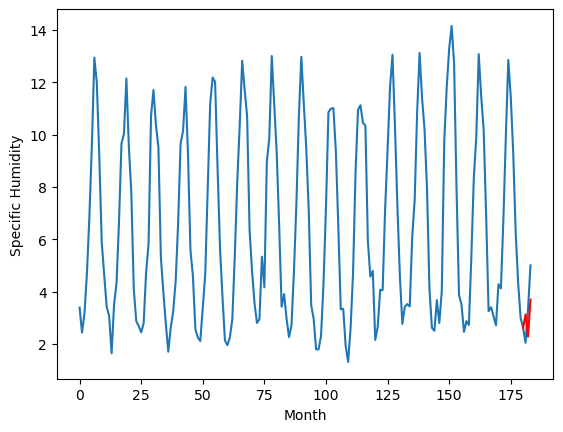

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.96   3.450873
1                 1    3.75   3.265055
2                 2    7.83   7.674496
3                 3    5.81   5.661646
4                 4    4.04   3.829466
5                 5    4.35   3.552675
6                 6    2.37   2.098515
7                 7    5.07   4.857744
8                 8    3.57   3.336900
9                 9    3.66   3.474526
10               10    3.46   3.121558


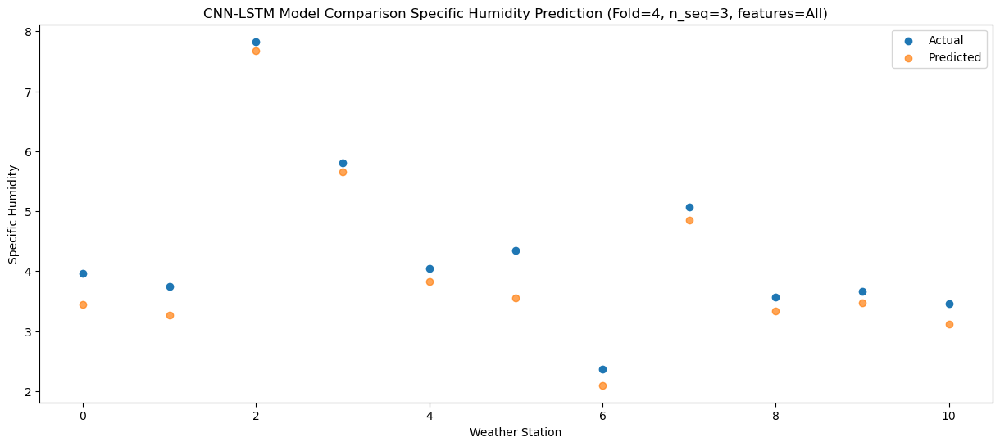

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    2.87   2.259079
1                 1    5.74   3.466645
2                 2    7.71   7.091568
3                 3    5.49   4.672345
4                 4    3.59   2.838444
5                 5    3.71   2.807377
6                 6    2.62   1.778361
7                 7    4.44   3.855376
8                 8    3.00   2.330207
9                 9    3.02   2.310529
10               10    2.89   2.274493


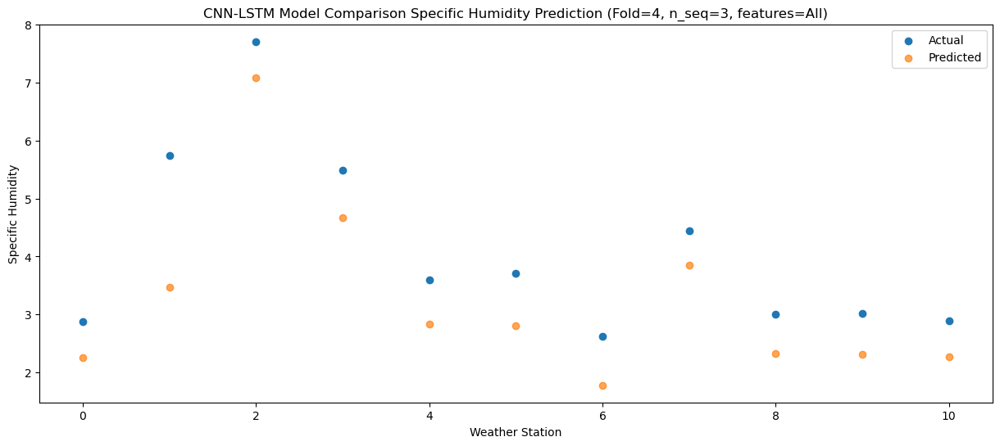

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    5.63   4.672945
1                 1    5.71   4.468846
2                 2   10.77   9.674337
3                 3    8.15   7.368657
4                 4    6.17   5.446960
5                 5    5.20   4.368624
6                 6    4.33   3.449510
7                 7    6.81   6.383341
8                 8    4.94   4.296546
9                 9    5.39   4.610672
10               10    4.18   3.690544


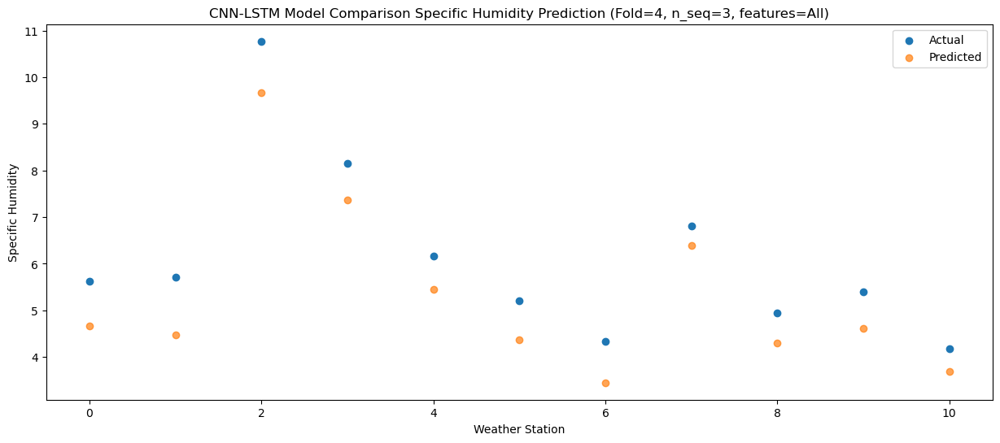

f, t:
[[ 3.96  3.75  7.83  5.81  4.04  4.35  2.37  5.07  3.57  3.66  3.46]
 [ 2.87  5.74  7.71  5.49  3.59  3.71  2.62  4.44  3.    3.02  2.89]
 [ 5.63  5.71 10.77  8.15  6.17  5.2   4.33  6.81  4.94  5.39  4.18]]
[[3.45087283 3.26505476 7.67449641 5.66164581 3.82946564 3.55267486
  2.09851485 4.85774374 3.33690046 3.47452627 3.1215575 ]
 [2.25907868 3.4666448  7.09156752 4.67234526 2.83844419 2.80737695
  1.77836071 3.85537565 2.33020745 2.31052921 2.27449265]
 [4.6729452  4.46884588 9.67433739 7.36865674 5.44695969 4.36862382
  3.44951009 6.38334143 4.29654597 4.6106715  3.69054356]]
Year at t+1:
t+1 SKRMSE: 0.374489
t+1 KRMSE: 0.374489
t+1 MAE: 0.322413
t+1 SKMAPE: 0.082626
t+1 R2_SCORE: 0.927115
t+1 KMAPE: 0.082626
t+1 PEARSON: 0.984068
t+1 AVERAGE ACTUAL: 4.351818
Year at t+2:
t+2 SKRMSE: 0.970141
t+2 KRMSE: 0.970141
t+2 MAE: 0.854143
t+2 SKMAPE: 0.219526
t+2 R2_SCORE: 0.597560
t+2 KMAPE: 0.219526
t+2 PEARSON: 0.909516
t+2 AVERAGE ACTUAL: 4.098182
Year at t+3:
t+3 SKRMSE: 0.836639

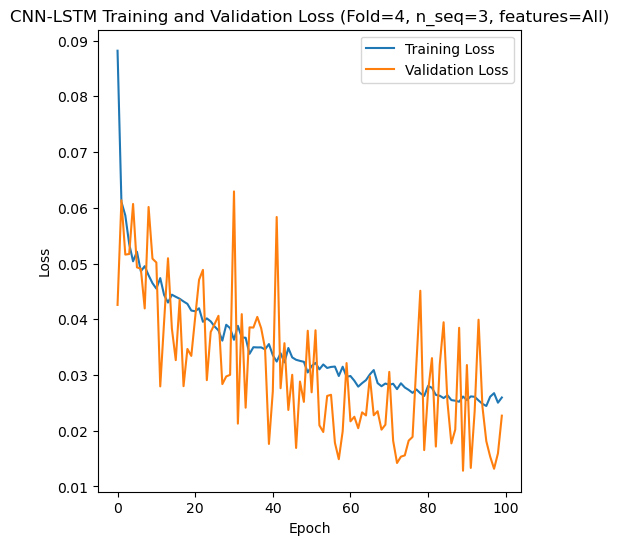

[[0.47808429155641313], [0.5455010797684846], [0.6005588423036381], [0.49399668924486295], [0.7705801270259133]]
[[array(0.47808429)], [array(0.54550108)], [array(0.60055884)], [array(0.49399669)], [array(0.77058013)]]
[[0.32467497399796486], [0.4832747962799937], [0.44756773707541553], [0.4115154488384726], [0.6603376519770331]]
[[0.04960748331913336], [0.12758695499345907], [0.09385662609692447], [0.10240032627807161], [0.1467767308753605]]
[[0.9396377973682866], [0.9270441258380555], [0.8831813143637186], [0.8247173915256079], [0.8216144404132808]]
[[array(0.04960748)], [array(0.12758695)], [array(0.09385663)], [array(0.10240033)], [array(0.14677673)]]
[[array(0.96641945)], [array(0.98152027)], [array(0.92100116)], [array(0.92758288)], [array(0.95260998)]]
[ 3.9   3.41  6.58  5.74  6.45  8.66  8.41  8.56 10.41  5.55  5.46  8.91
  7.36  6.96  9.8   4.02  4.61  6.18  6.35  6.4   7.99  4.55  4.58  6.2
  4.32  3.64  6.7   4.11  3.66  5.46  3.76  3.02  4.64  2.59  2.91  4.44
  6.45  6.64

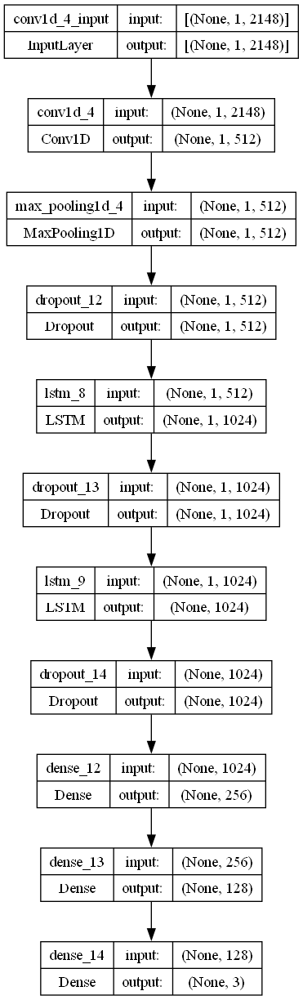

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 512
    lr = 0.027304079226114455
    optimizer = SGD(learning_rate = lr)
    activation_function = 'tanh'
    lstm_units = 1024
    dropout_rate = 0.31826102039211945

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (specific_humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))
print("")
print("Average Specific Humidity:"+str(np.mean(actual_avg_list)))
print("RMSE % of Specific Humidity:"+str(np.mean(rmse2_avg_list)/np.mean(actual_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S3.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)